In [3]:
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns
import os
from Pipelines import *

matplotlib.rcParams['font.family'] = 'Arial'
plt.style.use('seaborn-v0_8-talk')

## Get Adata

In [14]:
base_dir = "/project/cfRNA_Disentaglement/Data/OpenAccess/Processed"
var = pd.read_table("./Data/GECODEv49_Annot.tsv", index_col=0)
palangodb = pd.read_table("./Data/PalangoDB_CellTypeMarkers.tsv")
obs = pd.read_csv("./Data/OpenAccess/Processed/Meta_Processed.csv", index_col=0)
obs = obs.set_index('Row.names')
orig_counts = pd.read_csv("./Data/OpenAccess/Processed/Merged_featureCounts.csv", index_col=0)
cohorts = obs['BioProject'].unique()
print(f"Detected Cohorts: {cohorts}")

def load_and_concat_cohorts(base_dir, suffix, obs_index, var_index=None):
    df_list = []
    for cohort in cohorts:
        filename = f"Norm_{cohort}_{suffix}.csv"
        file_path = os.path.join(base_dir, filename)
        if os.path.exists(file_path):
            df = pd.read_csv(file_path, index_col=0).T
            df_list.append(df)
        else:
            print(f"  [Warning] Missing file for {cohort}: {filename}")
    if not df_list:
        raise FileNotFoundError(f"No files found for suffix: {suffix}")

    full_df = pd.concat(df_list, axis=0)
    if var_index is not None:
        full_df = full_df.reindex(index=obs_index, columns=var_index).fillna(0)
    else:
        full_df = full_df.reindex(index=obs_index).fillna(0)
        
    return full_df

Detected Cohorts: ['PRJNA574438' 'PRJNA701722' 'PRJNA729258' 'PRJNA758012'
 'PRJNA1073463-1073465' 'PRJNA517339']


In [15]:
df_raw = orig_counts.T
adata = sc.AnnData(df_raw)
adata.obs = adata.obs.merge(obs, left_index=True, right_index=True, how='left')
adata.var = adata.var.merge(var, left_index=True, right_index=True, how='left')

for col in adata.obs.columns:
    if adata.obs[col].dtype == 'object':
        adata.obs[col] = adata.obs[col].astype(str)

norm_layers = {
    "counts":"Raw",
    "log_TMM": "TMM_log2",
    "log_TPM": "TPM_log2",
    "log_FPKM": "FPKM_log2",
    "EDA_Full": "EDA_Full_All", 
    "EDA+RUVg_k1": "Proposed_Full_k1",
    "EDA+RUVg_k2": "Proposed_Full_k2",
    "EDA+RUVg_k3": "Proposed_Full_k3",
    "RUVg_k1": "RUVg_Platelet_k1",
    "RUVg_k2": "RUVg_Platelet_k2",
    "RUVg_k3": "RUVg_Platelet_k3",
}

for layer_name, file_suffix in norm_layers.items():
    print(f"Processing Layer: {layer_name} (Suffix: {file_suffix})...")
    try:
        df_norm = load_and_concat_cohorts(base_dir, file_suffix, adata.obs_names, adata.var_names)
        adata.layers[layer_name] = df_norm.values.astype(np.float32)
        print(f"  -> Added {layer_name}")
        
    except Exception as e:
        print(f"  [Error] Failed to add {layer_name}: {e}")

print("\nFinalizing...")      
        
temp = sc.AnnData(X=adata.layers['counts'].copy())
sc.pp.normalize_total(temp, target_sum=1e6)
sc.pp.log1p(temp)
adata.layers['Standard_LogCPM'] = temp.X
print("Baseline created.")

platelet_sigs = palangodb[palangodb['cell type'] == 'Platelets']
adata.var['is_platelet'] = False
adata.var.loc[adata.var['GeneName'].isin(platelet_sigs['official gene symbol']), 'is_platelet'] = True
adata.var['log10_Length'] = np.log10(adata.var['Length'])
print("Platelet Signature Annotated.")

Processing Layer: counts (Suffix: Raw)...
  -> Added counts
Processing Layer: log_TMM (Suffix: TMM_log2)...
  -> Added log_TMM
Processing Layer: log_TPM (Suffix: TPM_log2)...
  -> Added log_TPM
Processing Layer: log_FPKM (Suffix: FPKM_log2)...
  -> Added log_FPKM
Processing Layer: EDA_Full (Suffix: EDA_Full_All)...
  -> Added EDA_Full
Processing Layer: EDA+RUVg_k1 (Suffix: Proposed_Full_k1)...
  -> Added EDA+RUVg_k1
Processing Layer: EDA+RUVg_k2 (Suffix: Proposed_Full_k2)...
  -> Added EDA+RUVg_k2
Processing Layer: EDA+RUVg_k3 (Suffix: Proposed_Full_k3)...
  -> Added EDA+RUVg_k3
Processing Layer: RUVg_k1 (Suffix: RUVg_Platelet_k1)...
  -> Added RUVg_k1
Processing Layer: RUVg_k2 (Suffix: RUVg_Platelet_k2)...
  -> Added RUVg_k2
Processing Layer: RUVg_k3 (Suffix: RUVg_Platelet_k3)...
  -> Added RUVg_k3

Finalizing...
Baseline created.
Platelet Signature Annotated.


/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/legacy_api_wrap/__init__.py:82: UserWarning: Some cells have zero counts
  return fn(*args_all, **kw)


In [16]:
from Pipelines import calculate_bias_metrics, calculate_diversity_ratio

biases = calculate_bias_metrics(adata, layer='Standard_LogCPM')
adata.obs = pd.concat((adata.obs, biases), axis=1)
adata.obs['total_counts'] = adata.X.sum(axis=1)
adata.obs['log1p_total_counts'] = np.log1p(adata.obs['total_counts'].values)

np_ng_ratio = calculate_diversity_ratio(adata)
adata.obs = pd.concat((adata.obs, np_ng_ratio), axis=1)

unassigned_cols = [
        'Unassigned_Ambiguity', 'Unassigned_Chimera', 'Unassigned_Duplicate',
        'Unassigned_FragmentLength', 'Unassigned_MappingQuality', 'Unassigned_MultiMapping',
        'Unassigned_NoFeatures', 'Unassigned_NonSplit', 'Unassigned_Overlapping_Length',
        'Unassigned_Read_Type', 'Unassigned_Secondary', 'Unassigned_Singleton',
        'Unassigned_Unmapped'
    ]

n_assigned = adata.obs['Assigned']; n_unassigned = adata.obs[unassigned_cols].sum(axis=1)
total_reads = n_assigned + n_unassigned
fsr = n_assigned / total_reads
fsr_df = pd.DataFrame({
        'Total_Reads': total_reads,
        'Assigned_Reads': n_assigned,
        'Unassigned_Reads': n_unassigned,
        'FSR': fsr
    }, index=adata.obs.index)
adata.obs = pd.concat((adata.obs, fsr_df), axis=1)

--- Calculating Bias Metrics (Target Layer: Standard_LogCPM) ---
  > Computing GC bias score (LOESS)...
  > Computing Length bias score (Spearman)...
  > Computing Platelet scores (127 genes)...
Calculation Done.

Calculating NG80 (Total Library)...
Calculating NP80 (Subset: protein_coding)...


In [17]:
adata.obs['Batch_Granular'].unique()

array(['GEO_PRJNA574438_NextSeq 500_Plasma_Hybrid Selection',
       'MS_PRJNA574438_NextSeq 500_Plasma_Hybrid Selection',
       'MS_PRJNA701722_NextSeq 500_Serum_Hybrid Selection',
       'CORNELL_PRJNA701722_NextSeq 500_Serum_Hybrid Selection',
       'CORNELL_PRJNA729258_HiSeq X Ten_Plasma_cDNA',
       'GEO_PRJNA729258_HiSeq X Ten_Plasma_cDNA',
       'GEO_PRJNA758012_Illumina HiSeq 4000_Plasma_cDNA',
       'MS_PRJNA758012_Illumina HiSeq 4000_Plasma_cDNA',
       'MS_PRJNA1073463-1073465_NextSeq 500_Plasma_cDNA_Kisenyi',
       'MS_PRJNA1073463-1073465_NextSeq 500_Plasma_cDNA_Mulago',
       'MS_PRJNA1073463-1073465_NextSeq 500_Plasma_cDNA_Vietnam',
       'MS_PRJNA1073463-1073465_NextSeq 500_Plasma_cDNA_Uganda',
       'MS_PRJNA1073463-1073465_NextSeq 500_Plasma_cDNA_Philippines',
       'MS_PRJNA517339_NextSeq 500_Plasma_unspecified',
       'MS_PRJNA517339_NextSeq 500_Serum_unspecified'], dtype=object)

In [18]:
adata.write_h5ad("./Data/OpenAccess/Processed/Merged.h5ad")

## PCA

In [4]:
adata = sc.read_h5ad("./Data/OpenAccess/Processed/Merged.h5ad")

In [5]:
bias_metrics = ['gc_bias_score', 'len_bias_score', 'platelet_score', 'log1p_total_counts', 'NG80', 'NP80', 'NP80_NG80_ratio','FSR']
adata.obs['FSR'] = adata.obs['FSR'].fillna(0)

In [6]:
# ratio_cutoff = 100
# fsr_cutoff = 0.01
# outlier_ratio = adata.obs['NP80_NG80_ratio'] > ratio_cutoff
# outlier_fsr = adata.obs['FSR'] < fsr_cutoff

# outliers = outlier_ratio | outlier_fsr
# n_outliers = sum(outliers)
# adata = adata[~outliers].copy()
# print(f"--- Outlier Detection Summary ---")
# print(f"Total samples before: {adata.n_obs}")
# print(f"Samples with High Ratio (> {ratio_cutoff}): {sum(outlier_ratio)}")
# print(f"Samples with Low FSR    (< {fsr_cutoff}): {sum(outlier_fsr)}")
# print(f"Total to remove: {n_outliers} samples")

pipeline = RNASeqQCPipeline(
    adata=adata,              
    analysis_metrics=bias_metrics,
    phenotype_col='Type_Granular',
    batch_col='Batch_Granular')
pipeline.set_layer('Standard_LogCPM')

--- [Init] Preparing Metadata ---
  Active Metrics for Analysis: ['gc_bias_score', 'len_bias_score', 'platelet_score', 'log1p_total_counts', 'NG80', 'NP80', 'NP80_NG80_ratio', 'FSR']
--- Set Layer: Switching to 'Standard_LogCPM' ---
   [Filtering] Dropped 58838 genes with 0 expression in this layer.
   Remaining genes: 19853
   PCA reset. Active layer ready.



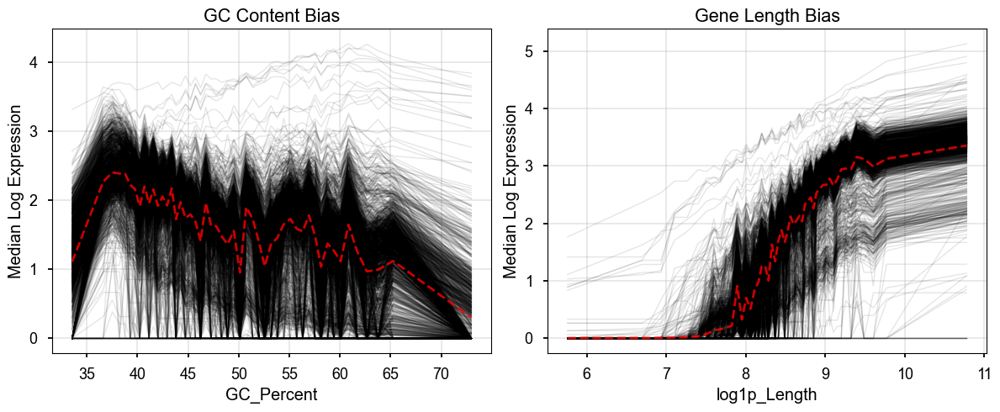

In [6]:
def plot_bias_patterns(adata, feature_key, n_bins=50, ax=None, title=None):
    # 1. Data Prep
    feat = adata.var[feature_key]
    valid = feat.notna()
    X = adata[:, valid].X
    feat = feat[valid]

    bins = pd.qcut(feat, q=n_bins, duplicates='drop')
    intervals = sorted(bins.unique())
    x_centers = [i.mid for i in intervals]
    
    sample_trends = []
    for b in intervals:
        mask = (bins == b).values
        bin_medians = np.median(X[:, mask], axis=1)
        sample_trends.append(bin_medians)
        
    df = pd.DataFrame(sample_trends, index=x_centers, columns=adata.obs_names)

    ax.plot(df.index, df.values, color='k', alpha=0.1, lw=1)
    ax.plot(df.index, df.mean(axis=1), color='r', alpha=0.8, lw=2, ls='--', label='Global Mean')
    ax.set_title(title if title else f"Bias: {feature_key}")
    ax.set_xlabel(feature_key)
    ax.set_ylabel("Median Log Expression")
    ax.grid(alpha=0.3)
    return ax

# --- Execution ---
fig, axes = plt.subplots(1, 2, figsize=(12, 5))
adata = pipeline.adata.copy()
adata.var['log1p_Length'] = np.log1p(adata.var['Length'])

plot_bias_patterns(adata, 'GC_Percent', ax=axes[0], title="GC Content Bias") 
plot_bias_patterns(adata, 'log1p_Length', ax=axes[1], title="Gene Length Bias") 

plt.tight_layout()
plt.show()

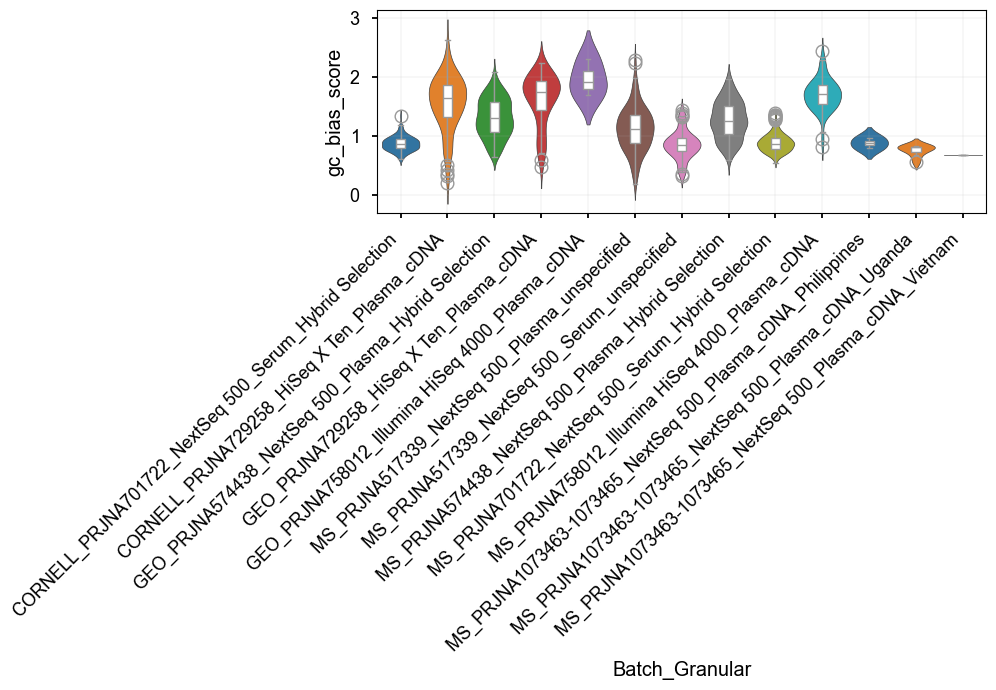

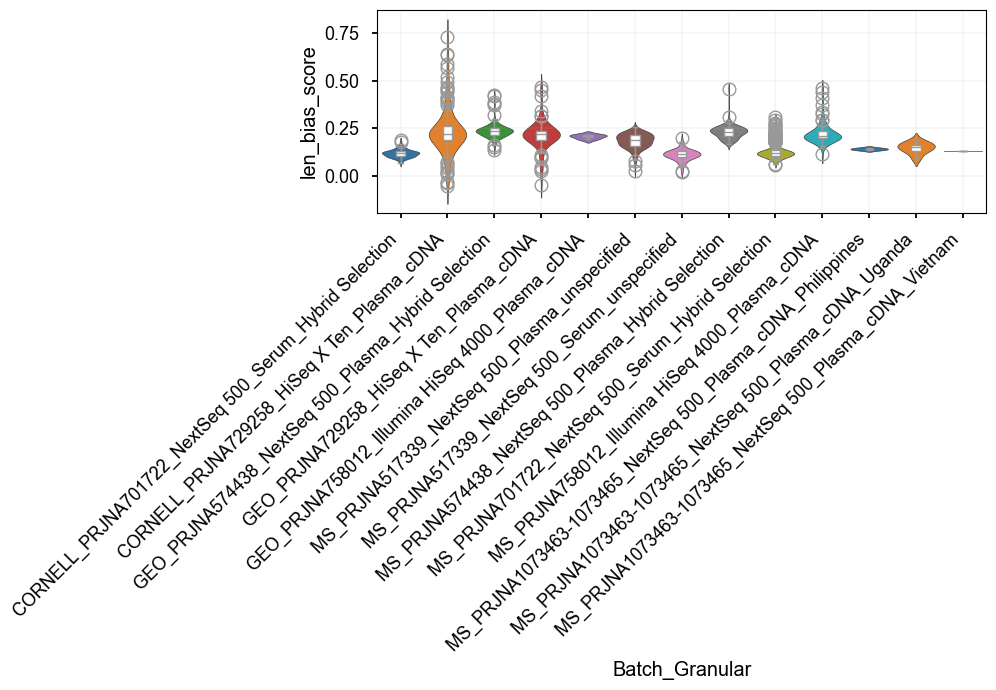

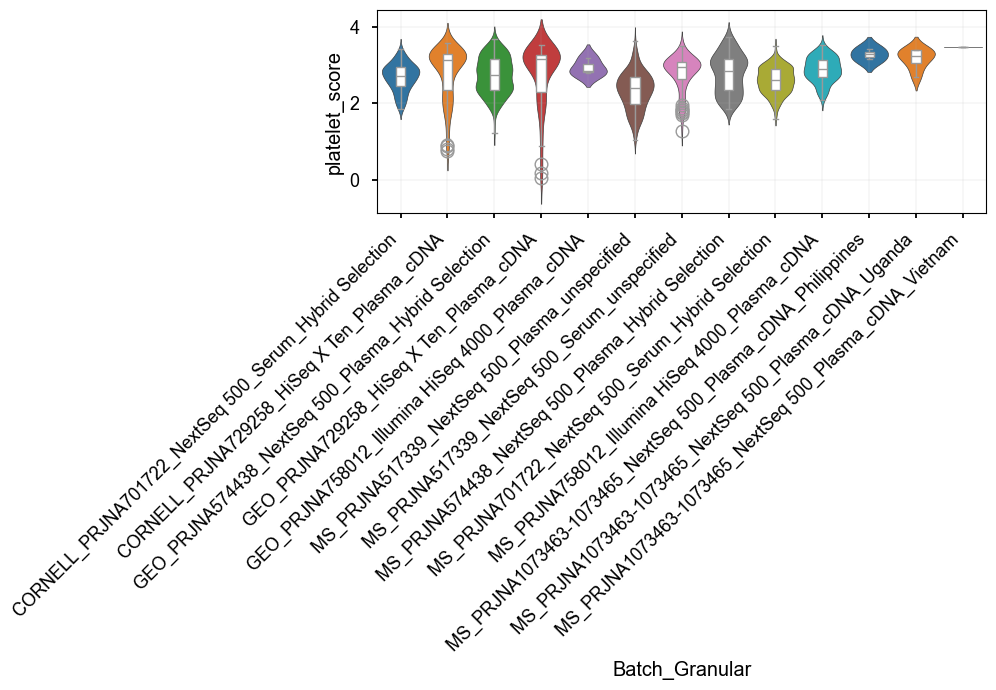

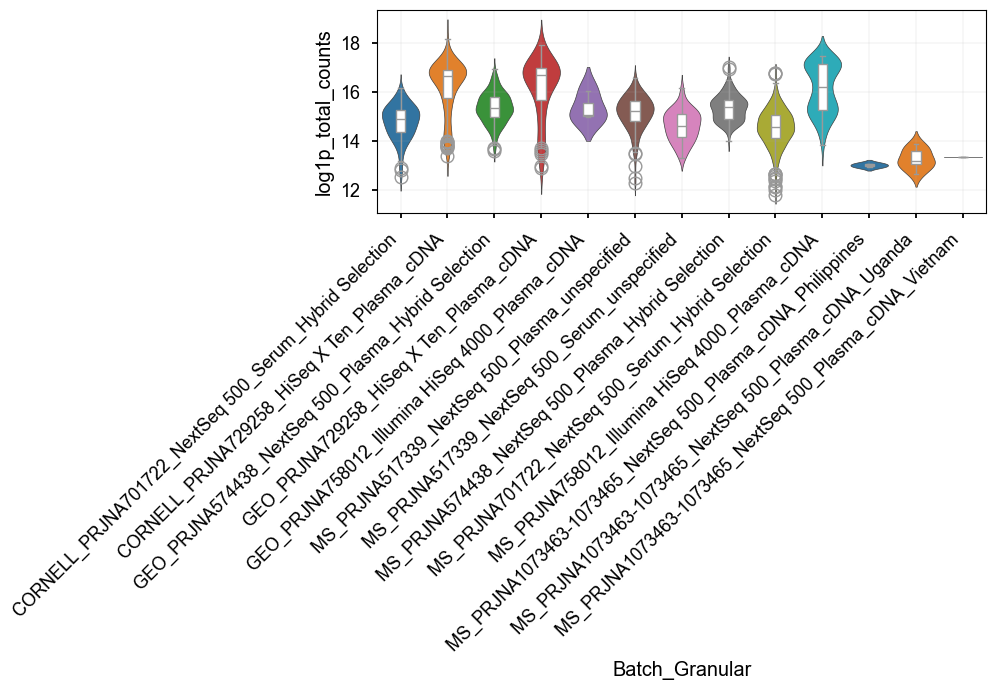

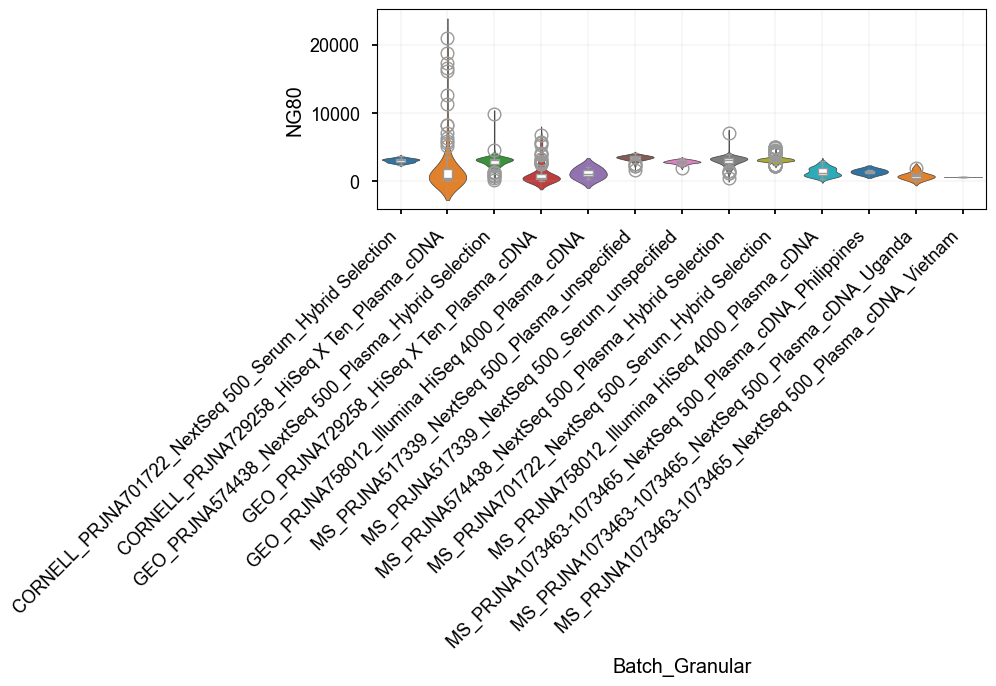

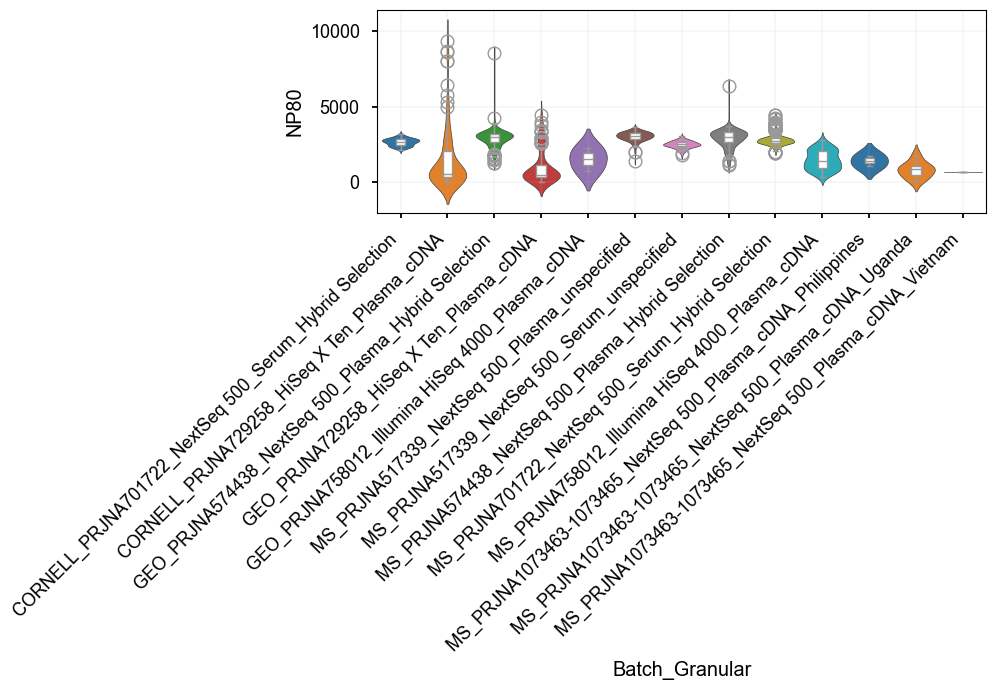

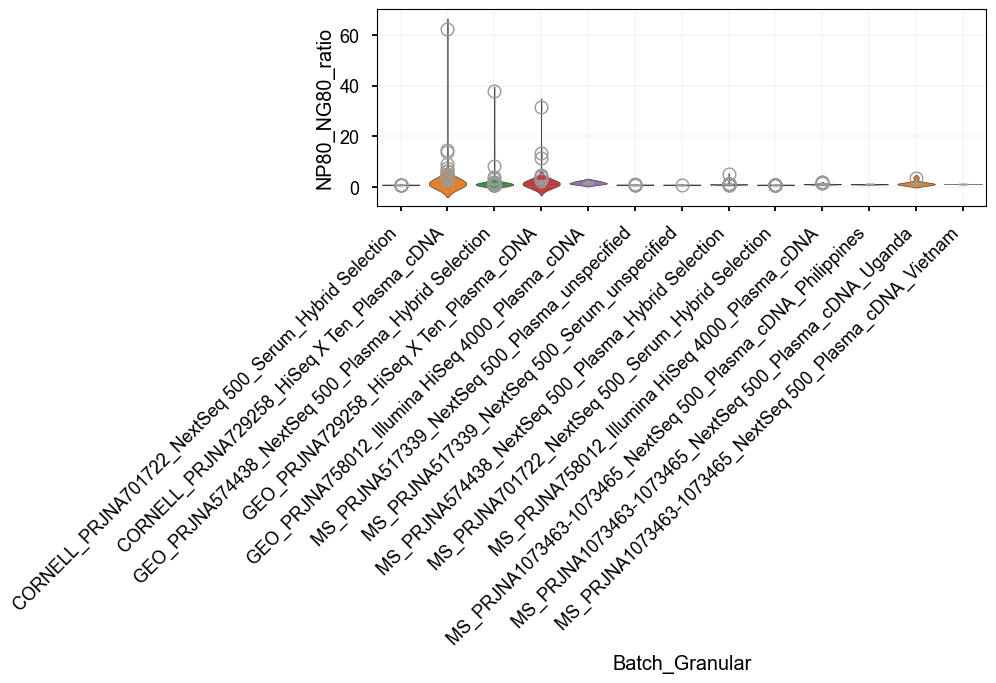

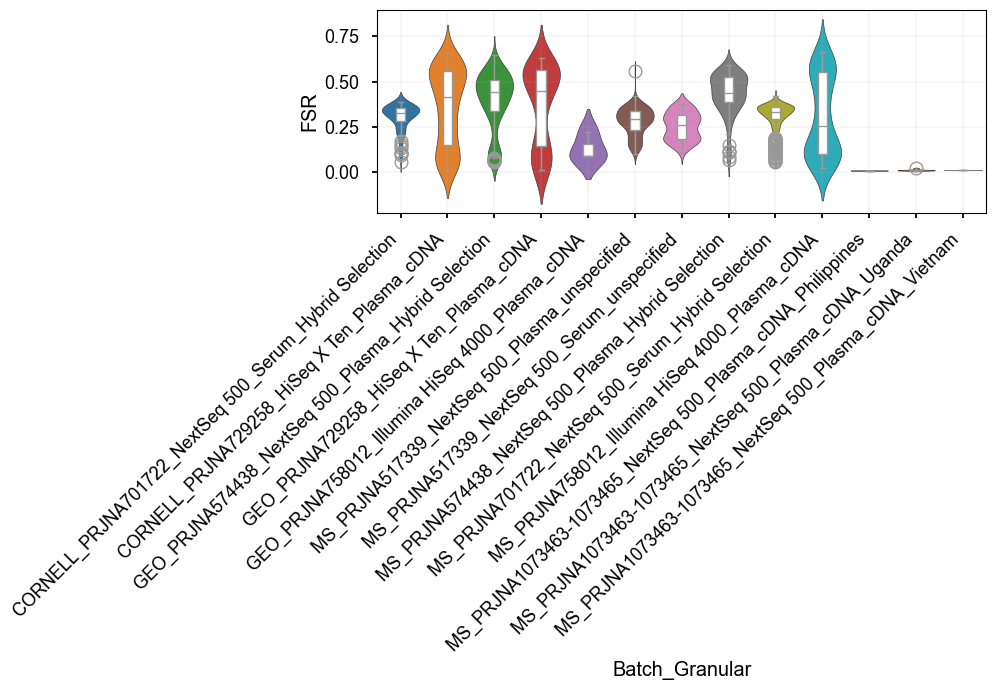

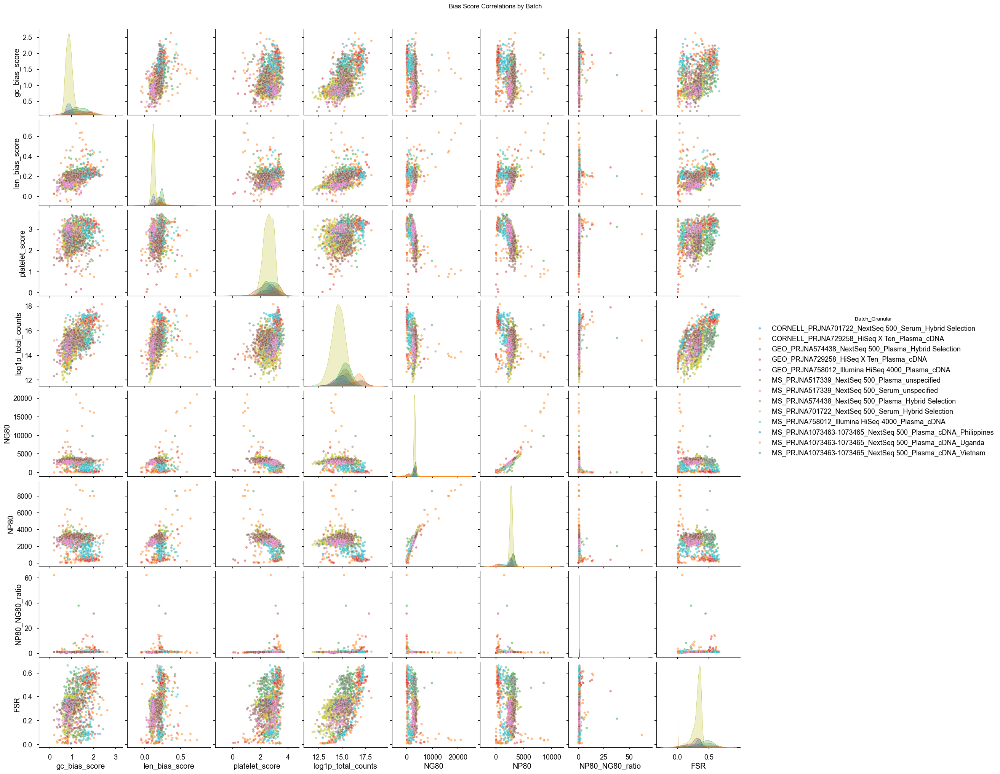

### Univariate Statistical Analysis (Batch Effect) ###
           Bias_Score  KW_Statistic  p-value  Eta_Squared Effect_Size_Class
0       gc_bias_score      819.1453      0.0       0.4284             Large
1      len_bias_score     1118.6183      0.0       0.5874             Large
2      platelet_score      212.8276      0.0       0.1066            Medium
3  log1p_total_counts      616.1656      0.0       0.3207             Large
4                NG80      653.7638      0.0       0.3406             Large
5                NP80      648.8014      0.0       0.3380             Large
6     NP80_NG80_ratio     1036.4537      0.0       0.5438             Large
7                 FSR      325.5608      0.0       0.1664             Large


/tmp/ipykernel_1385578/2487038432.py:84: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = [group[col].values for name, group in df.groupby(batch_col)]


In [7]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from scipy.spatial.distance import pdist, squareform
try:
    from skbio.stats.distance import permanova
    from skbio import DistanceMatrix
    has_skbio = True
except ImportError:
    has_skbio = False
    
df_obs = pipeline.adata.obs.copy()
bias_cols = bias_metrics
batch_col = 'Batch_Granular'
def plot_bias_distribution(df, bias_cols, batch_col):
    for col in bias_cols:
        plt.figure(figsize=(10, 7))
        ax = sns.violinplot(x=batch_col, y=col, data=df, inner=None, color=".8", hue=batch_col, palette='tab10')
        sns.boxplot(x=batch_col, y=col, data=df, width=0.2, ax=ax,
                    boxprops={'zorder': 2}, color="white")
        plt.xticks(rotation=45, ha='right')
        plt.tight_layout()
        plt.grid(alpha=0.1)
        plt.show()

def plot_bias_correlations(df, bias_cols, batch_col):
    g = sns.pairplot(df[bias_cols + [batch_col]], 
                     hue=batch_col, 
                     diag_kind="kde", 
                     plot_kws={'alpha': 0.5, 's': 20},
                     palette="tab10")
    
    g.fig.suptitle("Bias Score Correlations by Batch", y=1.02)
    plt.show()

def run_permanova_analysis(df, bias_cols, batch_col):
    if not has_skbio:
        print("Error: scikit-bio is not installed.")
        return None

    bias_z = df[bias_cols].apply(stats.zscore)
    clean_data = bias_z.join(df[batch_col]).dropna()
    
    if clean_data.empty:
        print("No data available after dropping NaNs.")
        return None

    bias_matrix = clean_data[bias_cols]
    grouping = clean_data[batch_col]

    dm = pdist(bias_matrix, metric='euclidean')
    dm_sq = squareform(dm)
    dist_matrix = DistanceMatrix(dm_sq, ids=clean_data.index)
    perm_results = permanova(dist_matrix, grouping=grouping, permutations=9999)
    summary_data = {
        "Test_Method": "PERMANOVA (Euclidean)",
        "Grouping_Var": batch_col,
        "N_Samples": int(perm_results['sample size']),
        "N_Groups": int(perm_results['number of groups']),
        "Pseudo_F": perm_results['test statistic'], # 효과 크기 지표 (클수록 그룹 간 차이 큼)
        "p_value": perm_results['p-value'],
        "Permutations": perm_results['number of permutations']
    }
    
    res_df = pd.DataFrame([summary_data])
    def get_sig_star(p):
        if p < 0.001: return '***'
        elif p < 0.01: return '**'
        elif p < 0.05: return '*'
        else: return 'ns'
        
    res_df['Sig'] = res_df['p_value'].apply(get_sig_star)
    cols_order = ["Test_Method", "Grouping_Var", "N_Samples", "N_Groups", "Pseudo_F", "p_value", "Sig", "Permutations"]
    res_df = res_df[cols_order]

    return res_df

def kruskal_wallis_test(df, bias_cols, batch_col):
    results = []
    for col in bias_cols:
        # 1. Kruskal-Wallis Test
        groups = [group[col].values for name, group in df.groupby(batch_col)]
        H, p = stats.kruskal(*groups)
        
        # 2. Effect Size (Eta-squared for H-statistic)
        # Formula: (H - k + 1) / (n - k)
        # k: number of groups, n: total observations
        k = len(groups)
        n = len(df)
        eta_sq = (H - k + 1) / (n - k)
        
        # 음수 보정 (아주 드물게 발생 가능)
        eta_sq = max(0, eta_sq)
        
        results.append({
            'Bias_Score': col,
            'KW_Statistic': H,
            'p-value': p,
            'Eta_Squared': eta_sq,
            'Effect_Size_Class': 'Large' if eta_sq > 0.14 else ('Medium' if eta_sq > 0.06 else 'Small')
        })

    stats_df = pd.DataFrame(results)
    print("### Univariate Statistical Analysis (Batch Effect) ###")
    print(stats_df.round(4))
    return stats_df 

plot_bias_distribution(df_obs, bias_cols, batch_col)
plot_bias_correlations(df_obs, bias_cols, batch_col)
permanova_stats = run_permanova_analysis(df_obs, bias_cols, batch_col)
kruskal_stats = kruskal_wallis_test(df_obs, bias_cols, batch_col)

In [8]:
kruskal_stats

,Bias_Score,KW_Statistic,p-value,Eta_Squared,Effect_Size_Class
0,gc_bias_score,819.145321,1.296129e-167,0.428421,Large
1,len_bias_score,1118.618288,5.729231e-232,0.587377,Large
2,platelet_score,212.827590,7.270738e-39,0.106596,Medium
3,log1p_total_counts,616.165584,3.737508e-124,0.320682,Large
4,NG80,653.763823,3.439032e-132,0.340639,Large
5,NP80,648.801396,3.958397e-131,0.338005,Large
6,NP80_NG80_ratio,1036.453656,2.720000e-214,0.543765,Large
7,FSR,325.560754,1.984598e-62,0.166434,Large


In [9]:
permanova_stats

,Test_Method,Grouping_Var,N_Samples,N_Groups,Pseudo_F,p_value,Sig,Permutations
0,PERMANOVA (Euclidean),Batch_Granular,1897,13,64.504623,0.0001,***,9999


/tmp/ipykernel_1389707/1718200139.py:29: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for batch, group_data in df_clean.groupby(batch_col):


Plotting gc_bias_score ... (Valid Batches: 14)


/tmp/ipykernel_1389707/1718200139.py:50: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  group_max = data.groupby(x)[y].max()
/tmp/ipykernel_1389707/1718200139.py:50: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  group_max = data.groupby(x)[y].max()
/tmp/ipykernel_1389707/1718200139.py:50: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  group_max = data.groupby(x)[y].max()
/tmp/ipykernel_1389707/1718200139.py:50: FutureWarni

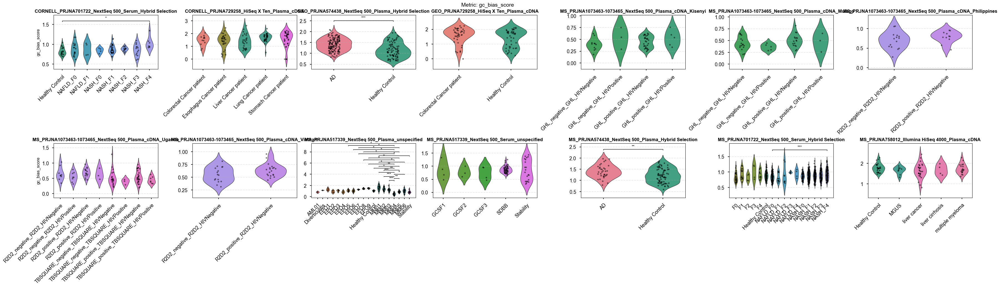

/tmp/ipykernel_1389707/1718200139.py:29: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for batch, group_data in df_clean.groupby(batch_col):
/tmp/ipykernel_1389707/1718200139.py:50: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  group_max = data.groupby(x)[y].max()


Plotting len_bias_score ... (Valid Batches: 14)


/tmp/ipykernel_1389707/1718200139.py:50: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  group_max = data.groupby(x)[y].max()
/tmp/ipykernel_1389707/1718200139.py:50: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  group_max = data.groupby(x)[y].max()
/tmp/ipykernel_1389707/1718200139.py:50: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  group_max = data.groupby(x)[y].max()
/tmp/ipykernel_1389707/1718200139.py:50: FutureWarni

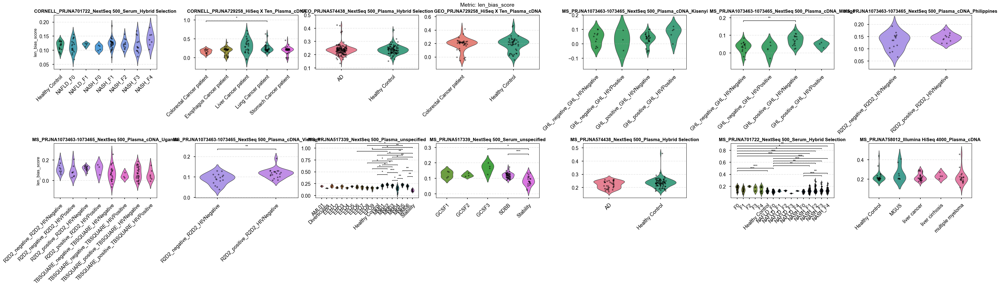

/tmp/ipykernel_1389707/1718200139.py:29: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for batch, group_data in df_clean.groupby(batch_col):
/tmp/ipykernel_1389707/1718200139.py:50: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  group_max = data.groupby(x)[y].max()


Plotting platelet_score ... (Valid Batches: 14)


/tmp/ipykernel_1389707/1718200139.py:50: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  group_max = data.groupby(x)[y].max()
/tmp/ipykernel_1389707/1718200139.py:50: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  group_max = data.groupby(x)[y].max()
/tmp/ipykernel_1389707/1718200139.py:50: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  group_max = data.groupby(x)[y].max()
/tmp/ipykernel_1389707/1718200139.py:50: FutureWarni

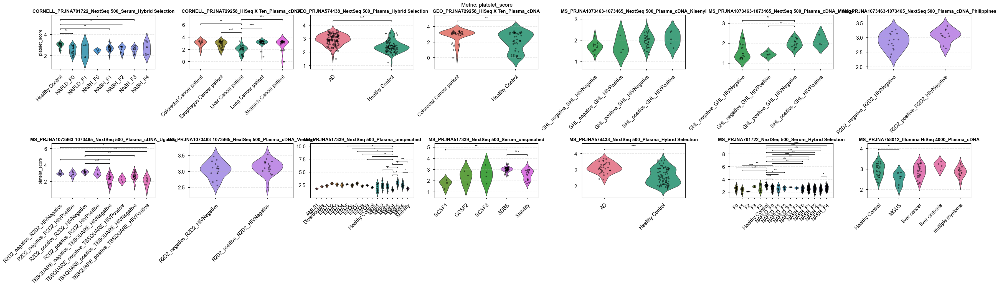

/tmp/ipykernel_1389707/1718200139.py:29: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for batch, group_data in df_clean.groupby(batch_col):


Plotting log1p_total_counts ... (Valid Batches: 14)


/tmp/ipykernel_1389707/1718200139.py:50: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  group_max = data.groupby(x)[y].max()
/tmp/ipykernel_1389707/1718200139.py:50: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  group_max = data.groupby(x)[y].max()
/tmp/ipykernel_1389707/1718200139.py:50: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  group_max = data.groupby(x)[y].max()
/tmp/ipykernel_1389707/1718200139.py:50: FutureWarni

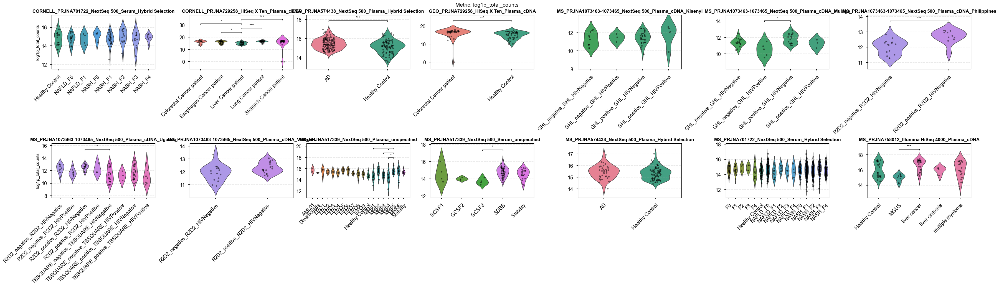

/tmp/ipykernel_1389707/1718200139.py:29: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for batch, group_data in df_clean.groupby(batch_col):
/tmp/ipykernel_1389707/1718200139.py:50: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  group_max = data.groupby(x)[y].max()


Plotting NG80 ... (Valid Batches: 14)


/tmp/ipykernel_1389707/1718200139.py:50: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  group_max = data.groupby(x)[y].max()
/tmp/ipykernel_1389707/1718200139.py:50: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  group_max = data.groupby(x)[y].max()
/tmp/ipykernel_1389707/1718200139.py:50: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  group_max = data.groupby(x)[y].max()
/tmp/ipykernel_1389707/1718200139.py:50: FutureWarni

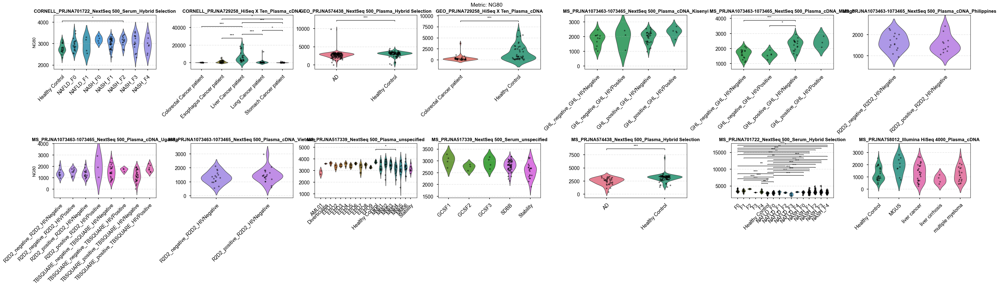

/tmp/ipykernel_1389707/1718200139.py:29: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for batch, group_data in df_clean.groupby(batch_col):
/tmp/ipykernel_1389707/1718200139.py:50: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  group_max = data.groupby(x)[y].max()


Plotting NP80 ... (Valid Batches: 14)


/tmp/ipykernel_1389707/1718200139.py:50: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  group_max = data.groupby(x)[y].max()
/tmp/ipykernel_1389707/1718200139.py:50: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  group_max = data.groupby(x)[y].max()
/tmp/ipykernel_1389707/1718200139.py:50: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  group_max = data.groupby(x)[y].max()
/tmp/ipykernel_1389707/1718200139.py:50: FutureWarni

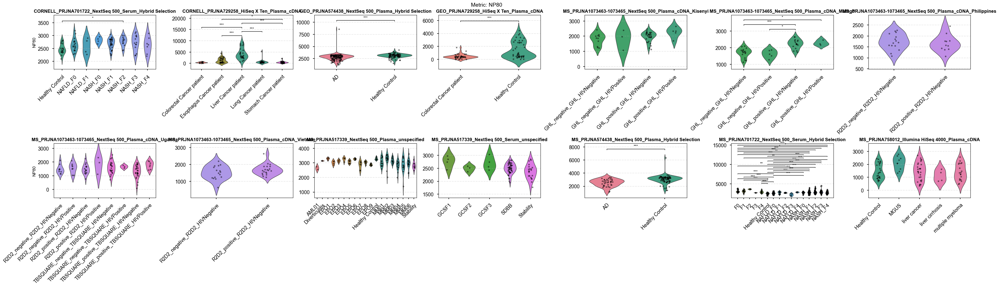

/tmp/ipykernel_1389707/1718200139.py:29: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for batch, group_data in df_clean.groupby(batch_col):
/tmp/ipykernel_1389707/1718200139.py:50: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  group_max = data.groupby(x)[y].max()


Plotting NP80_NG80_ratio ... (Valid Batches: 14)


/tmp/ipykernel_1389707/1718200139.py:50: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  group_max = data.groupby(x)[y].max()
/tmp/ipykernel_1389707/1718200139.py:50: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  group_max = data.groupby(x)[y].max()
/tmp/ipykernel_1389707/1718200139.py:50: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  group_max = data.groupby(x)[y].max()
/tmp/ipykernel_1389707/1718200139.py:50: FutureWarni

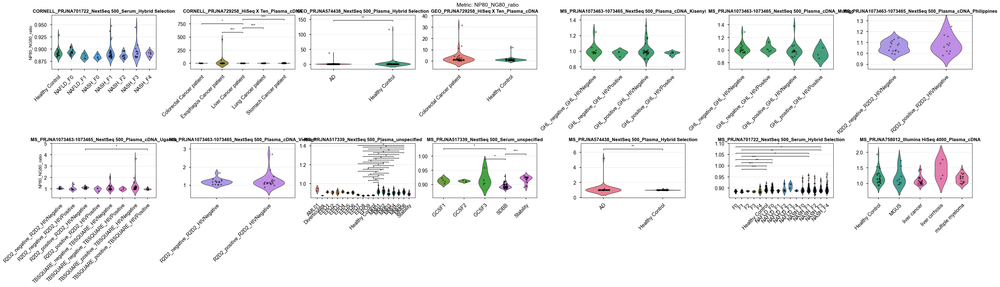

/tmp/ipykernel_1389707/1718200139.py:29: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for batch, group_data in df_clean.groupby(batch_col):
/tmp/ipykernel_1389707/1718200139.py:50: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  group_max = data.groupby(x)[y].max()


Plotting FSR ... (Valid Batches: 14)


/tmp/ipykernel_1389707/1718200139.py:50: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  group_max = data.groupby(x)[y].max()
/tmp/ipykernel_1389707/1718200139.py:50: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  group_max = data.groupby(x)[y].max()
/tmp/ipykernel_1389707/1718200139.py:50: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  group_max = data.groupby(x)[y].max()
/tmp/ipykernel_1389707/1718200139.py:50: FutureWarni

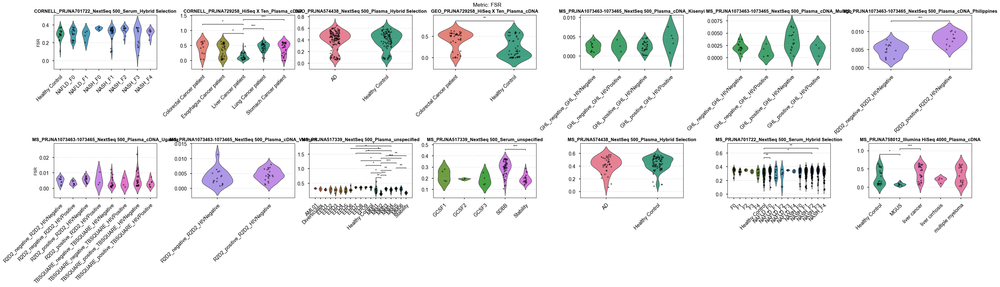

In [7]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
from itertools import combinations
import math

# 데이터 복사 및 설정
obs = pipeline.adata.obs.copy()
bias_metrics = ['gc_bias_score', 'len_bias_score', 'platelet_score', 'log1p_total_counts', 'NG80', 'NP80', 'NP80_NG80_ratio', 'FSR']
batch_col = 'Batch_Granular'
pheno_col = 'Type_Granular'

def check_batch_validity(df, batch_col, pheno_col, metric_col, min_samples=2):
    """
    특정 Metric에 대해 해당 배치가 분석 가능한지 판단하는 함수.
    조건:
    1. 데이터에 NaN이 없어야 함.
    2. 서로 다른 표현형 그룹(Phenotype)이 2개 이상이어야 함.
    3. 각 표현형 그룹별 샘플 수가 min_samples(기본 2)개 이상이어야 함.
    """
    valid_batches = []
    
    # 1. NaN 제거
    df_clean = df[[batch_col, pheno_col, metric_col]].dropna()
    
    # 배치별로 순회하며 조건 검사
    for batch, group_data in df_clean.groupby(batch_col):
        # 그룹별 샘플 수 카운트
        counts = group_data[pheno_col].value_counts()
        
        # 샘플 수가 min_samples 이상인 그룹만 남김
        valid_groups = counts[counts >= min_samples].index
        
        # 유효한 그룹이 2개 이상이어야 비교(통계) 가능
        if len(valid_groups) >= 2:
            valid_batches.append(batch)
            
    return sorted(valid_batches)

def add_stat_annotation(ax, data, x, y, order, pairs, test='Wilcoxon', text_format='star', p_threshold=0.05):
    y_min, y_max = ax.get_ylim()
    y_range = y_max - y_min
    line_height = y_range * 0.02
    text_height = y_range * 0.02
    step_height = y_range * 0.08 
    
    if data.empty: return
    group_max = data.groupby(x)[y].max()
    if group_max.empty: return
    current_y = group_max.max() + (y_range * 0.1)

    significant_combinations = []
    
    for pair in pairs:
        g1, g2 = pair
        d1 = data[data[x] == g1][y]
        d2 = data[data[x] == g2][y]

        # 엄격한 필터링: 한쪽이라도 샘플이 2개 미만이면 통계 패스
        if len(d1) < 2 or len(d2) < 2: continue

        try:
            # Mann-Whitney U test (Wilcoxon Rank-Sum)
            stat, p_val = stats.ranksums(d1, d2)
        except ValueError:
            continue
            
        # Bonferroni Correction
        adj_p_val = p_val * len(pairs)
        if adj_p_val > 1.0: adj_p_val = 1.0
        
        if adj_p_val < p_threshold:
            significant_combinations.append(((g1, g2), adj_p_val))

    significant_combinations.sort(key=lambda x: abs(order.index(x[0][0]) - order.index(x[0][1])))

    for (g1, g2), p_val in significant_combinations:
        x1 = order.index(g1)
        x2 = order.index(g2)
        
        if p_val < 0.001: star = '***'
        elif p_val < 0.01: star = '**'
        elif p_val < 0.05: star = '*'
        else: star = 'ns'
        
        text = f"p={p_val:.1e}" if text_format == 'full' else star

        bar_y = current_y + step_height
        ax.plot([x1, x1, x2, x2], [bar_y, bar_y + line_height, bar_y + line_height, bar_y], lw=1.0, c='black')
        ax.text((x1 + x2) / 2, bar_y + line_height + text_height, text, ha='center', va='bottom', color='black', fontsize=10)
        current_y = bar_y + line_height + text_height

    ax.set_ylim(y_min, current_y + (y_range * 0.1))

# --- Main Plotting Loop ---

for metric in bias_metrics:
    # 1. 각 Metric 별로 유효한 배치 먼저 선별 (엄격한 기준 적용)
    valid_batches = check_batch_validity(obs, batch_col, pheno_col, metric, min_samples=2)
    
    if not valid_batches:
        print(f"Skipping {metric}: 통계 분석 가능한 배치가 없습니다.")
        continue

    print(f"Plotting {metric} ... (Valid Batches: {len(valid_batches)})")
    
    n_batches = len(valid_batches)
    n_rows = 2
    n_cols = math.ceil(n_batches / n_rows)
    
    # Figure 크기 동적 할당
    fig_width = max(8, n_cols * 5)
    fig_height = 10 

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(fig_width, fig_height), constrained_layout=True)
    
    # n_rows=2 이므로 axes는 항상 배열 형태지만, 안전하게 flatten 처리
    axes_flat = axes.flatten()

    for i, batch in enumerate(valid_batches):
        ax = axes_flat[i]
        
        # 해당 배치의 데이터 추출 및 NaN 제거
        subset = obs[obs[batch_col] == batch][[batch_col, pheno_col, metric]].dropna()
        
        # 샘플 수가 적은 그룹 제거 (시각화 깔끔하게 하기 위함)
        counts = subset[pheno_col].value_counts()
        valid_groups = counts[counts >= 2].index
        subset = subset[subset[pheno_col].isin(valid_groups)]
        
        local_order = sorted(subset[pheno_col].unique())
        
        # Plotting
        sns.violinplot(data=subset, x=pheno_col, y=metric, order=local_order,
                       ax=ax, hue=pheno_col, inner=None, linewidth=1., width=0.6, dodge=False)
        
        sns.stripplot(data=subset, x=pheno_col, y=metric, order=local_order,
                      ax=ax, color='black', alpha=0.5, size=4, jitter=True)

        # Statistics
        combs = list(combinations(local_order, 2))
        add_stat_annotation(ax, subset, x=pheno_col, y=metric, 
                            order=local_order, pairs=combs,
                            test='Wilcoxon', text_format='star')
        
        ax.set_title(f"{batch}", fontweight='bold', fontsize=12)
        ax.set_xlabel("")
        
        # Y축 라벨: 각 행의 첫 번째 열에만 표시
        if i % n_cols == 0:
            ax.set_ylabel(metric, fontsize=11)
        else:
            ax.set_ylabel("")
        
        ax.set_xticks(range(len(local_order)))
        ax.set_xticklabels(local_order, rotation=45, ha='right', rotation_mode='anchor')
        ax.grid(axis='y', linestyle='--', alpha=0.3)
        
        if ax.get_legend(): ax.get_legend().remove()

    # 남는(빈) 서브플롯 숨기기
    for j in range(i + 1, len(axes_flat)):
        axes_flat[j].axis('off')

    plt.suptitle(f"Metric: {metric}", fontsize=14, y=1.02)
    plt.show()


 Processing: PRJNA574438
--- [Init] Preparing Metadata ---
  Active Metrics for Analysis: ['gc_bias_score', 'len_bias_score', 'platelet_score', 'log1p_total_counts', 'NG80', 'NP80', 'NP80_NG80_ratio', 'FSR']
--- Set Layer: Switching to 'Standard_LogCPM' ---
   [Filtering] Dropped 46415 genes with 0 expression in this layer.
   Remaining genes: 19695
   PCA reset. Active layer ready.

--- [Analysis] PCA Diagnostics ---


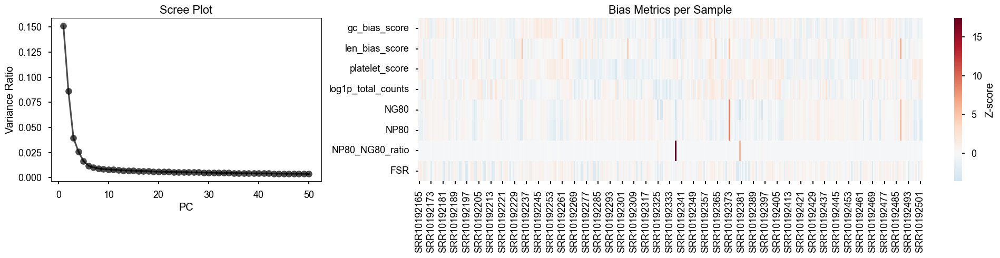


[Info] Simplified batch labels for plotting (Original -> Simple):
  * batch_1 : GEO_PRJNA574438_NextSeq 500_Plasma_Hybrid Selection
  * batch_2 : MS_PRJNA574438_NextSeq 500_Plasma_Hybrid Selection

--- [Analysis] PCA Scatter Plots ---


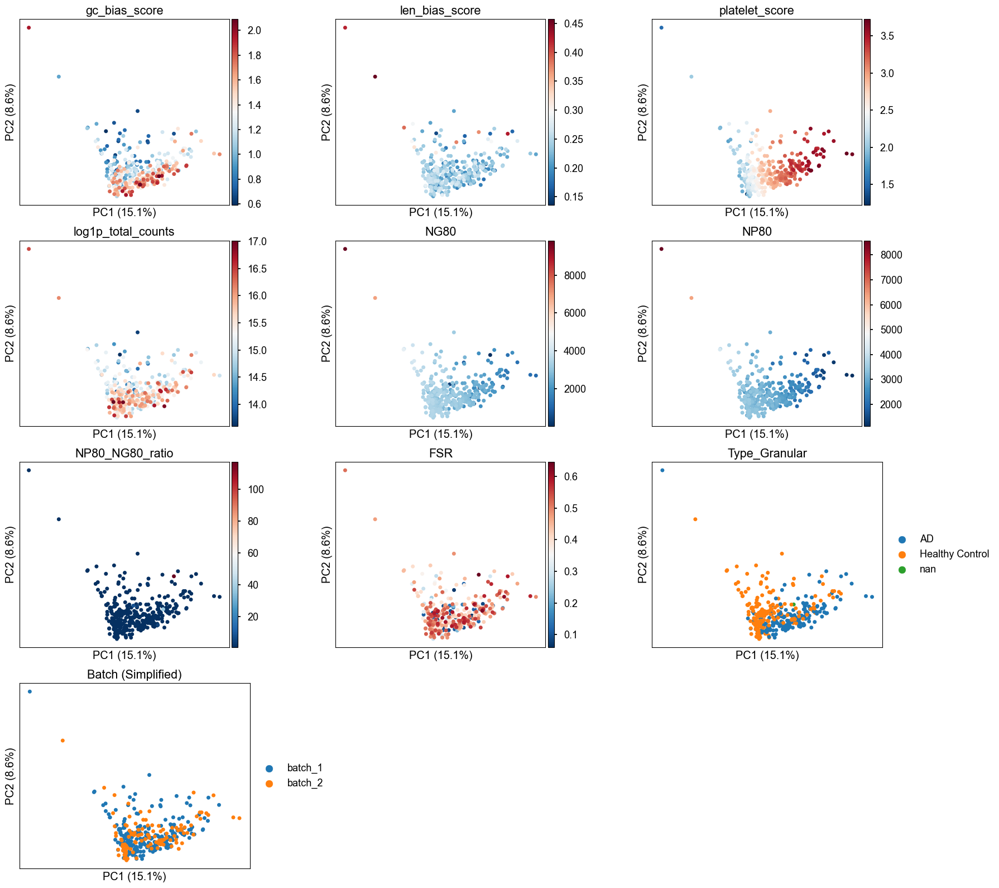

/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/statsmodels/base/model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 2, but rank is 1
  warnings.warn('covariance of constraints does not have full '
/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/statsmodels/base/model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 2, but rank is 1
  warnings.warn('covariance of constraints does not have full '
/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/statsmodels/base/model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 2, but rank is 1
  warnings.warn('covariance of constraints does not have full '
/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/statsmodels/base/model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 2

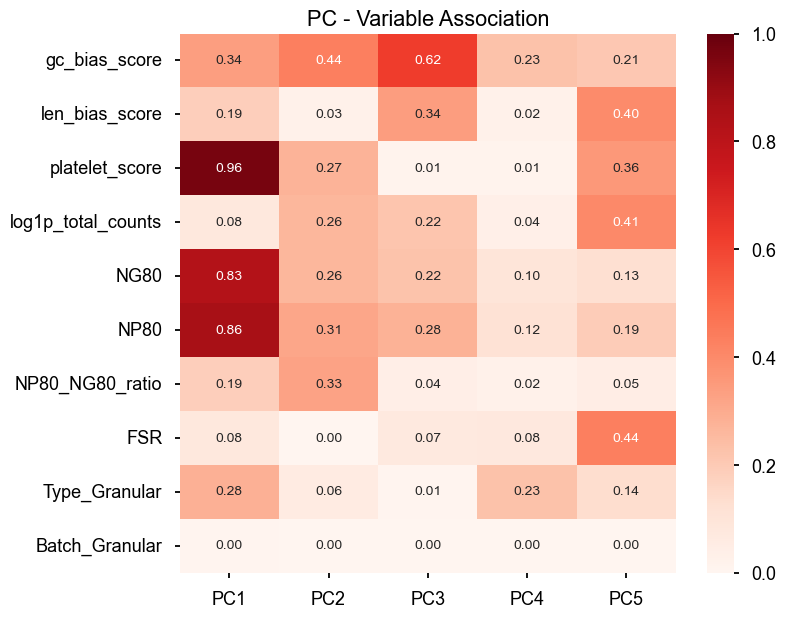

--- [Analysis] Partial Correlation (Control Confounders) ---


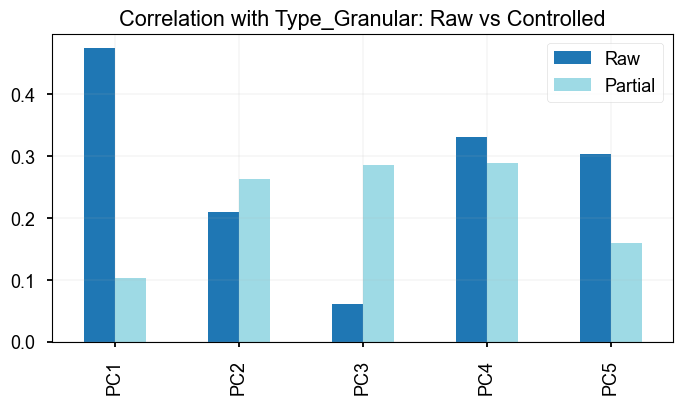

--- [Analysis] Cascade Correction (Method: combat) ---
   -> Regress out ['gc_bias_score', 'len_bias_score', 'log1p_total_counts', 'NG80', 'NP80', 'NP80_NG80_ratio', 'FSR']


/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/statsmodels/base/model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 2, but rank is 1
  warnings.warn('covariance of constraints does not have full '
/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/statsmodels/base/model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 2, but rank is 1
  warnings.warn('covariance of constraints does not have full '
/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/statsmodels/base/model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 2, but rank is 1
  warnings.warn('covariance of constraints does not have full '


   -> Regress out ['platelet_score']
   -> ComBat on ['Batch_Granular']


/home/mjcho/miniconda3/envs/scRNA/lib/python3.10/site-packages/statsmodels/base/model.py:1894: ValueWarning: covariance of constraints does not have full rank. The number of constraints is 2, but rank is 1
  warnings.warn('covariance of constraints does not have full '


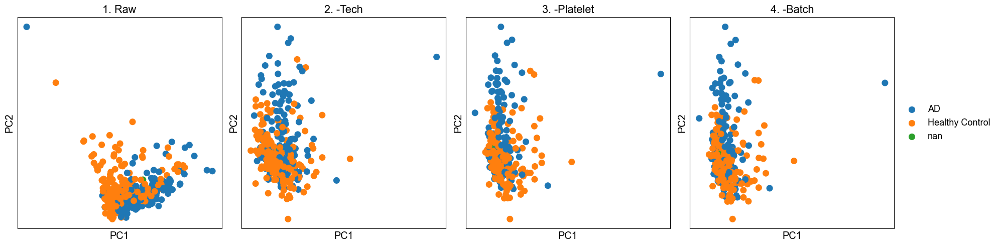

Displaying Metric Evolution...


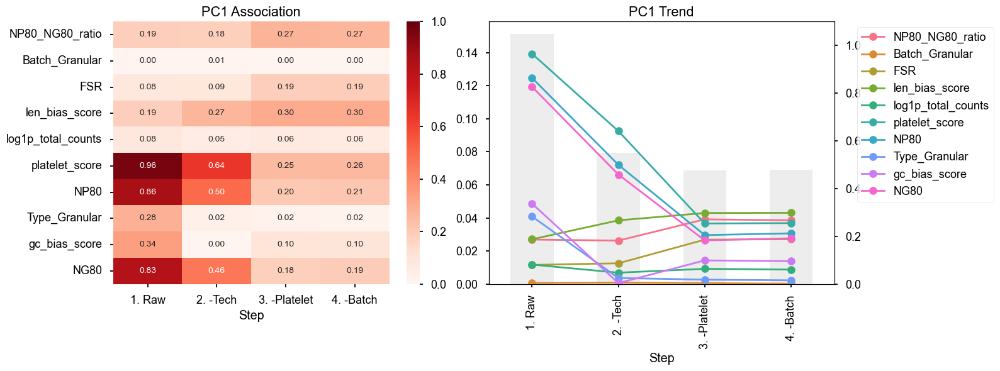

--- Finished Analysis for PRJNA574438 ---

 Processing: PRJNA701722
--- [Init] Preparing Metadata ---
  Active Metrics for Analysis: ['gc_bias_score', 'len_bias_score', 'platelet_score', 'log1p_total_counts', 'NG80', 'NP80', 'NP80_NG80_ratio', 'FSR']
--- Set Layer: Switching to 'Standard_LogCPM' ---
   [Filtering] Dropped 20638 genes with 0 expression in this layer.
   Remaining genes: 19454
   PCA reset. Active layer ready.

--- [Analysis] PCA Diagnostics ---


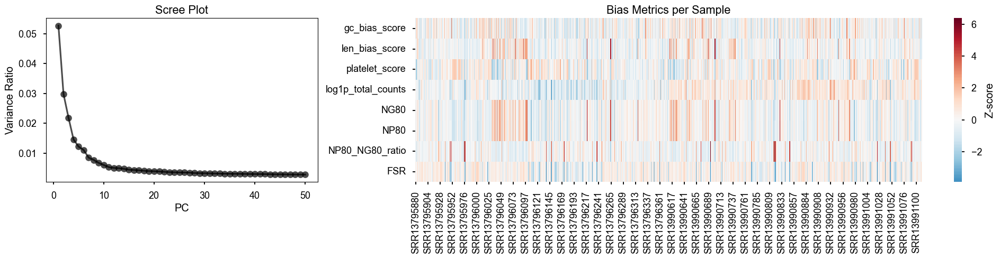


[Info] Simplified batch labels for plotting (Original -> Simple):
  * batch_1 : CORNELL_PRJNA701722_NextSeq 500_Serum_Hybrid Selection
  * batch_2 : MS_PRJNA701722_NextSeq 500_Serum_Hybrid Selection

--- [Analysis] PCA Scatter Plots ---


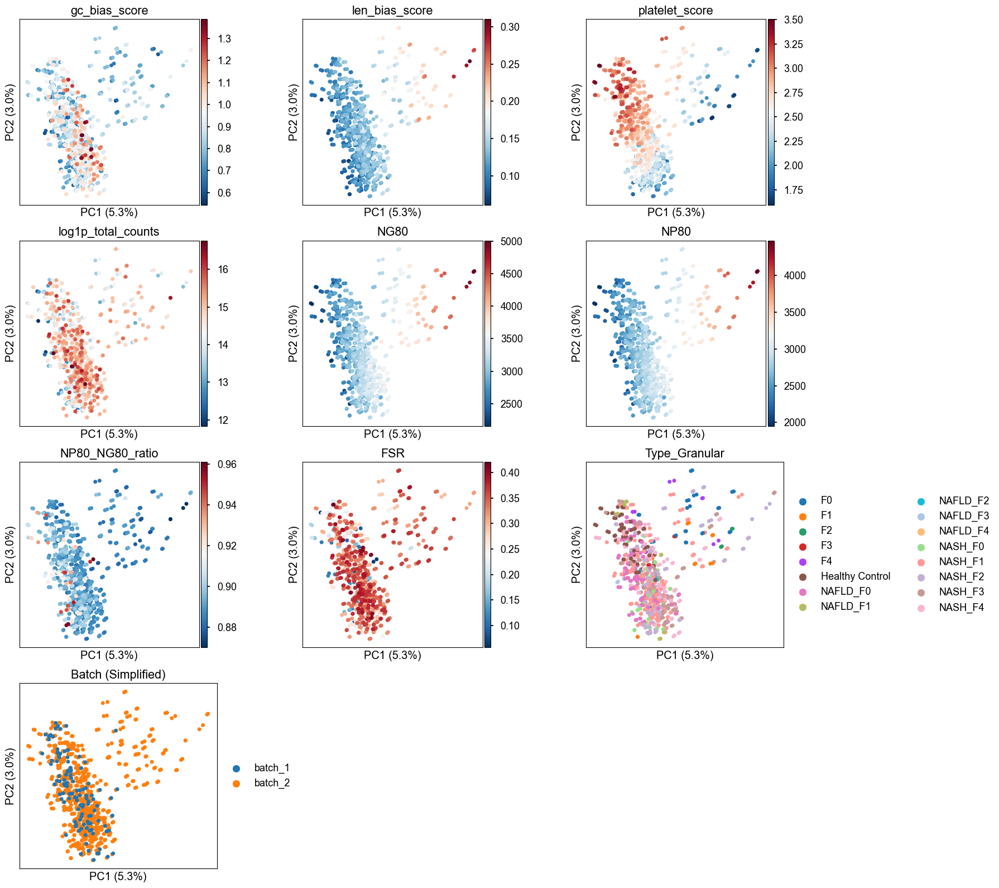

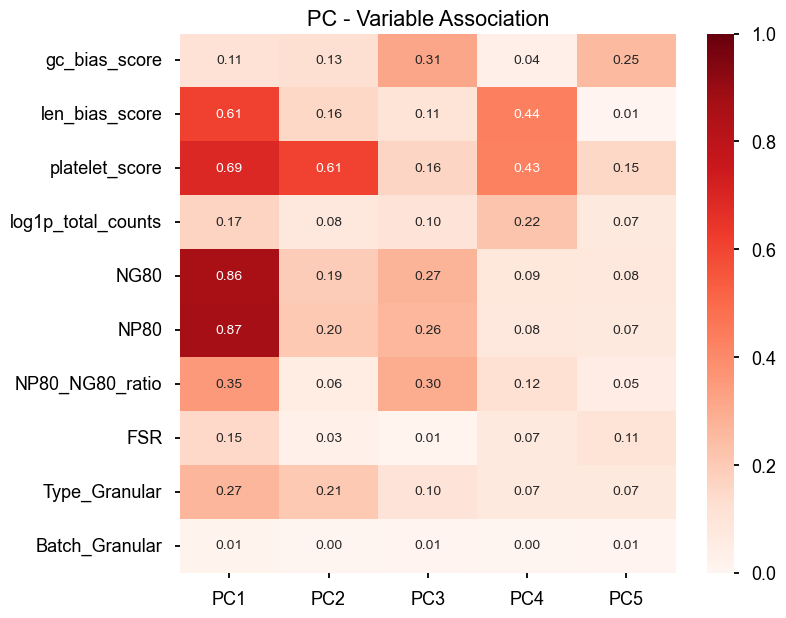

--- [Analysis] Partial Correlation (Control Confounders) ---


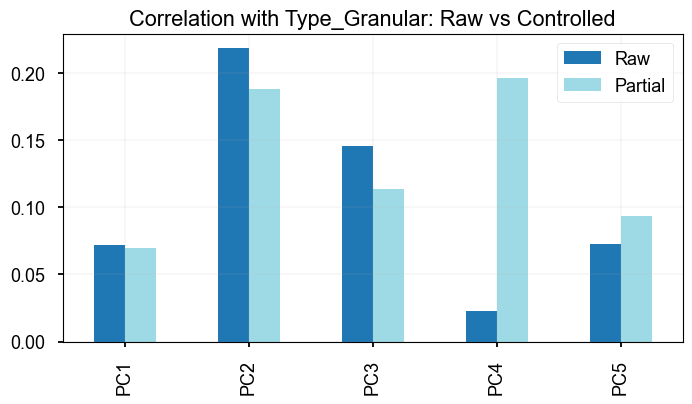

--- [Analysis] Cascade Correction (Method: combat) ---
   -> Regress out ['gc_bias_score', 'len_bias_score', 'log1p_total_counts', 'NG80', 'NP80', 'NP80_NG80_ratio', 'FSR']
   -> Regress out ['platelet_score']
   -> ComBat on ['Batch_Granular']


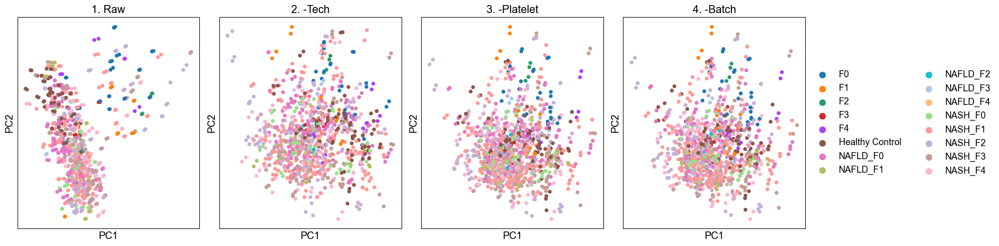

Displaying Metric Evolution...


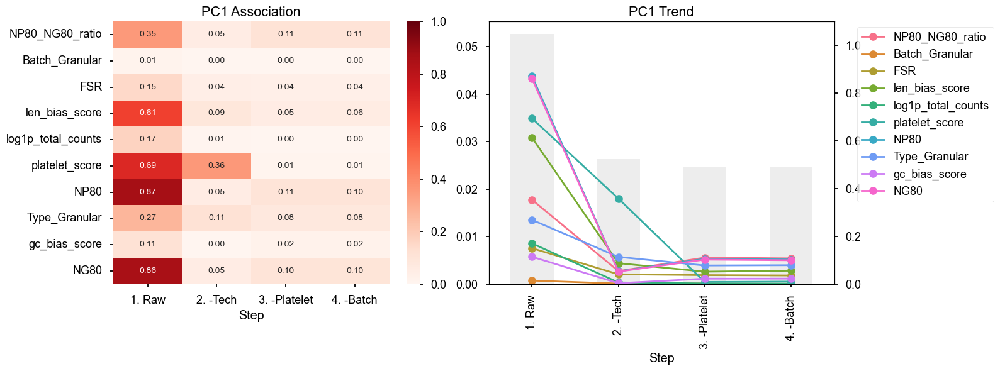

--- Finished Analysis for PRJNA701722 ---

 Processing: PRJNA729258
--- [Init] Preparing Metadata ---
  Active Metrics for Analysis: ['gc_bias_score', 'len_bias_score', 'platelet_score', 'log1p_total_counts', 'NG80', 'NP80', 'NP80_NG80_ratio', 'FSR']
--- Set Layer: Switching to 'Standard_LogCPM' ---
   [Filtering] Dropped 54813 genes with 0 expression in this layer.
   Remaining genes: 19756
   PCA reset. Active layer ready.

--- [Analysis] PCA Diagnostics ---


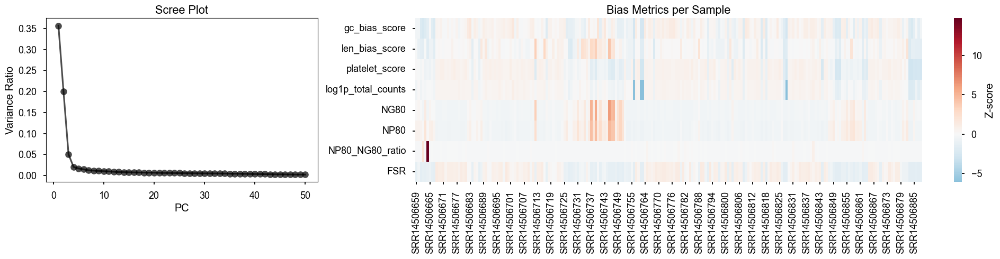


[Info] Simplified batch labels for plotting (Original -> Simple):
  * batch_1 : CORNELL_PRJNA729258_HiSeq X Ten_Plasma_cDNA
  * batch_2 : GEO_PRJNA729258_HiSeq X Ten_Plasma_cDNA

--- [Analysis] PCA Scatter Plots ---


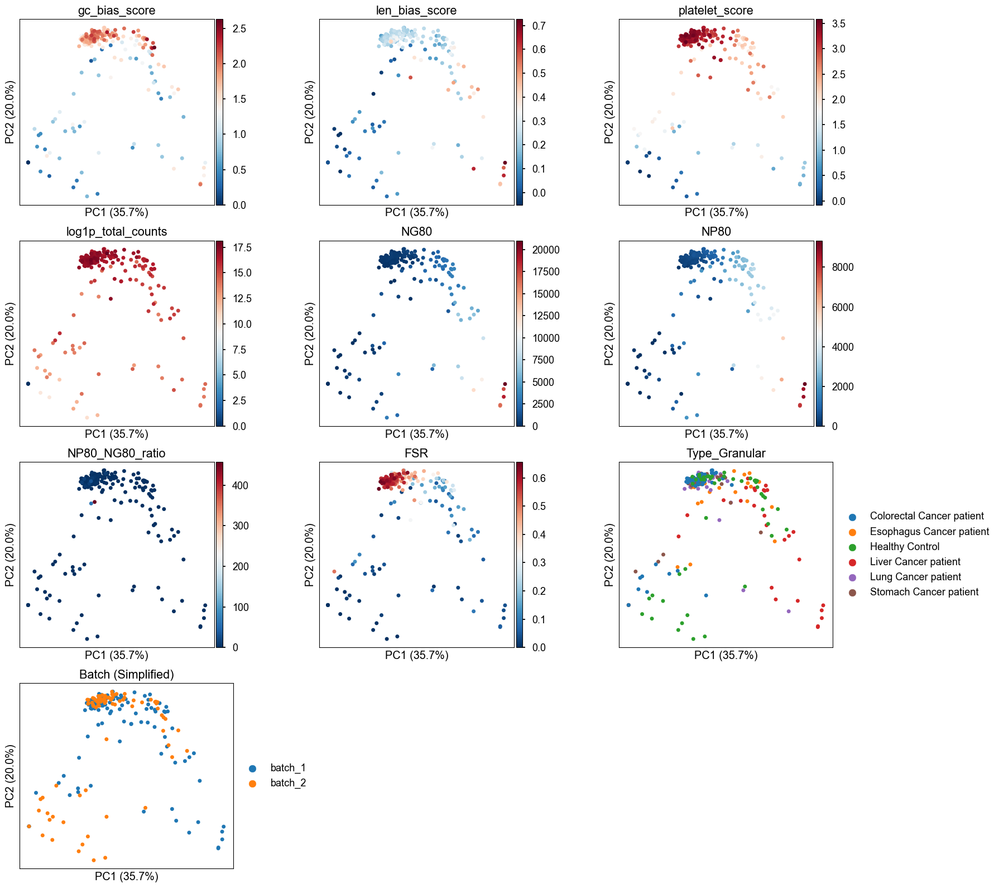

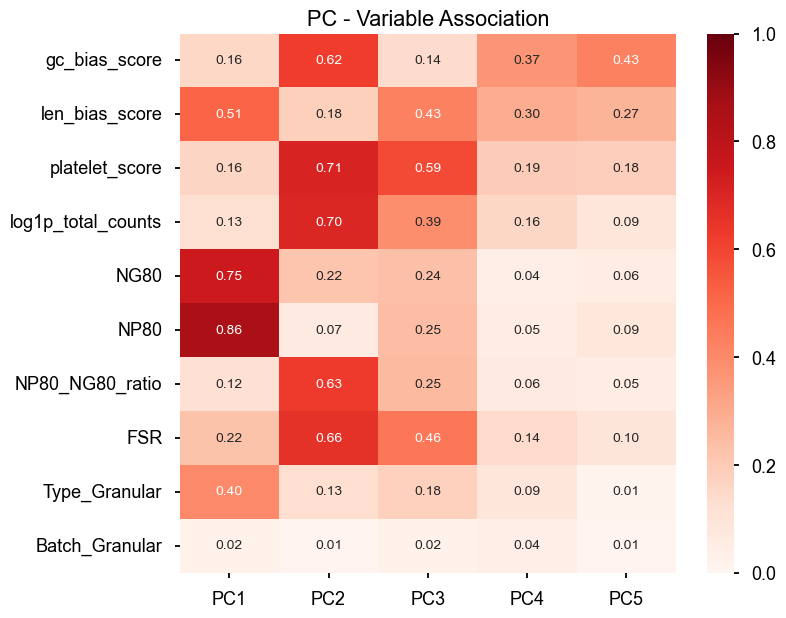

--- [Analysis] Partial Correlation (Control Confounders) ---


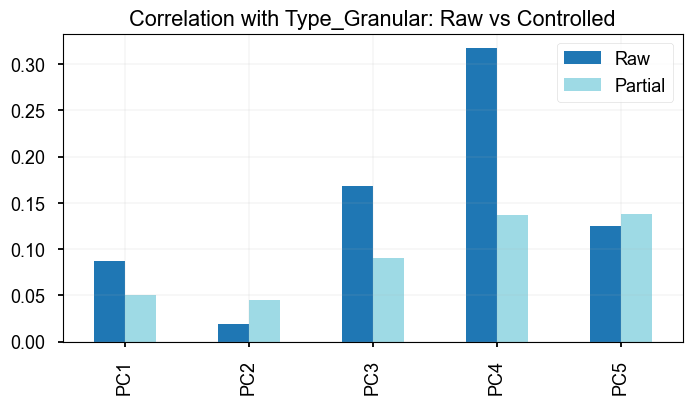

--- [Analysis] Cascade Correction (Method: combat) ---
   -> Regress out ['gc_bias_score', 'len_bias_score', 'log1p_total_counts', 'NG80', 'NP80', 'NP80_NG80_ratio', 'FSR']
   -> Regress out ['platelet_score']
   -> ComBat on ['Batch_Granular']


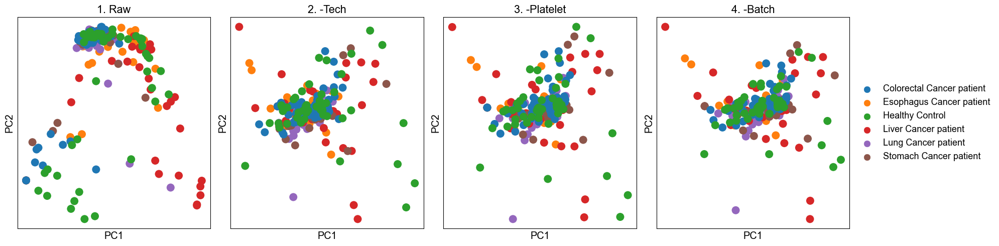

Displaying Metric Evolution...


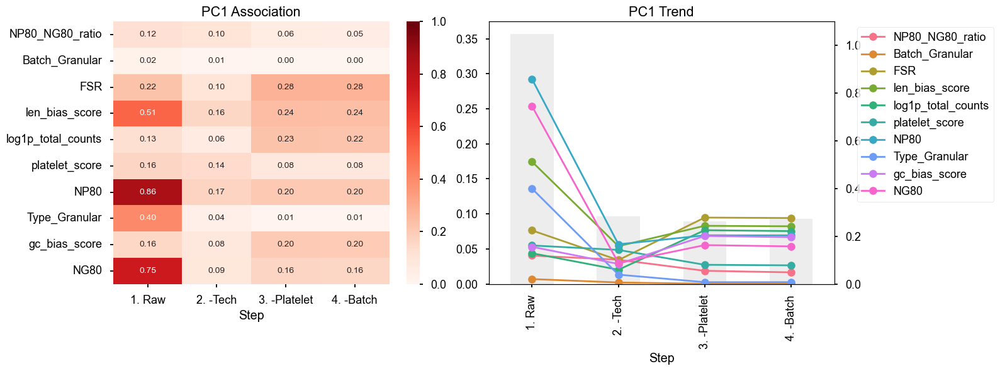

--- Finished Analysis for PRJNA729258 ---

 Processing: PRJNA758012
--- [Init] Preparing Metadata ---
  Active Metrics for Analysis: ['gc_bias_score', 'len_bias_score', 'platelet_score', 'log1p_total_counts', 'NG80', 'NP80', 'NP80_NG80_ratio', 'FSR']
--- Set Layer: Switching to 'Standard_LogCPM' ---
   [Filtering] Dropped 51273 genes with 0 expression in this layer.
   Remaining genes: 19563
   PCA reset. Active layer ready.

--- [Analysis] PCA Diagnostics ---


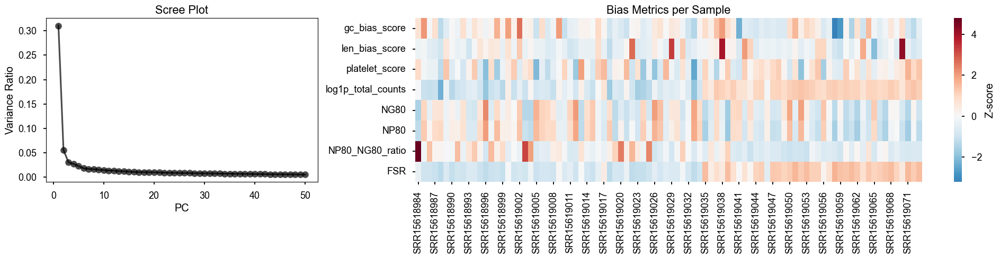


[Info] Simplified batch labels for plotting (Original -> Simple):
  * batch_1 : GEO_PRJNA758012_Illumina HiSeq 4000_Plasma_cDNA
  * batch_2 : MS_PRJNA758012_Illumina HiSeq 4000_Plasma_cDNA

--- [Analysis] PCA Scatter Plots ---


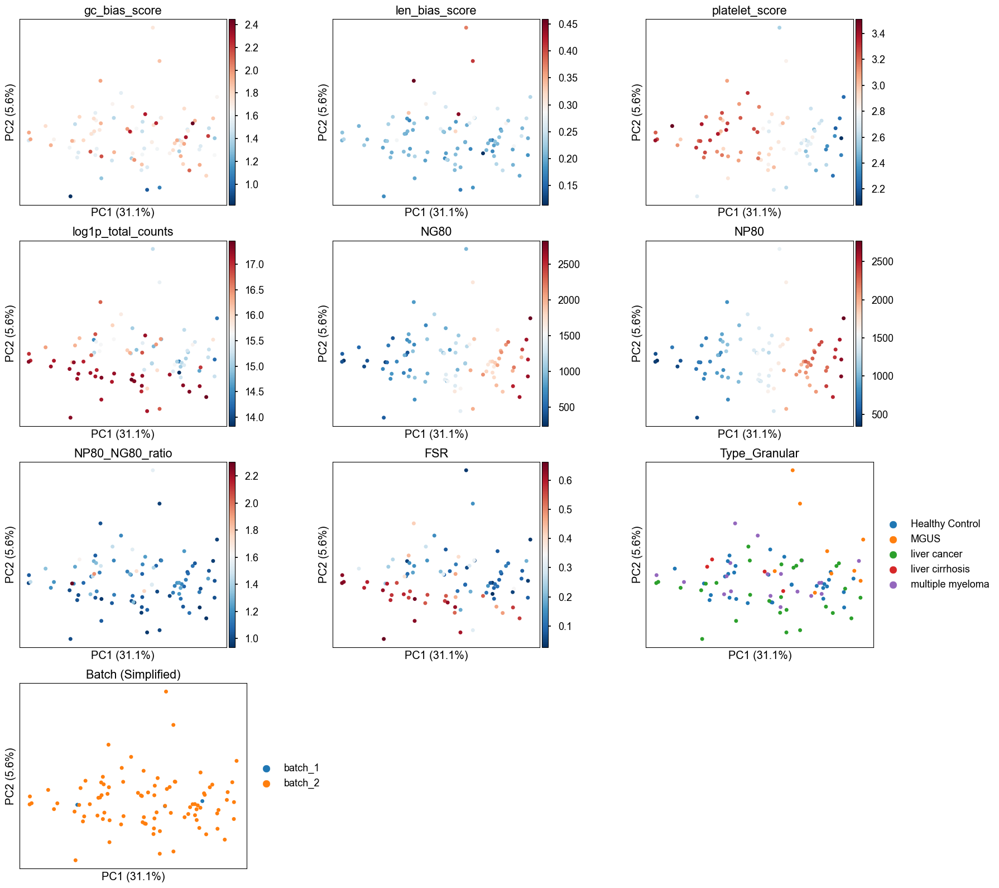

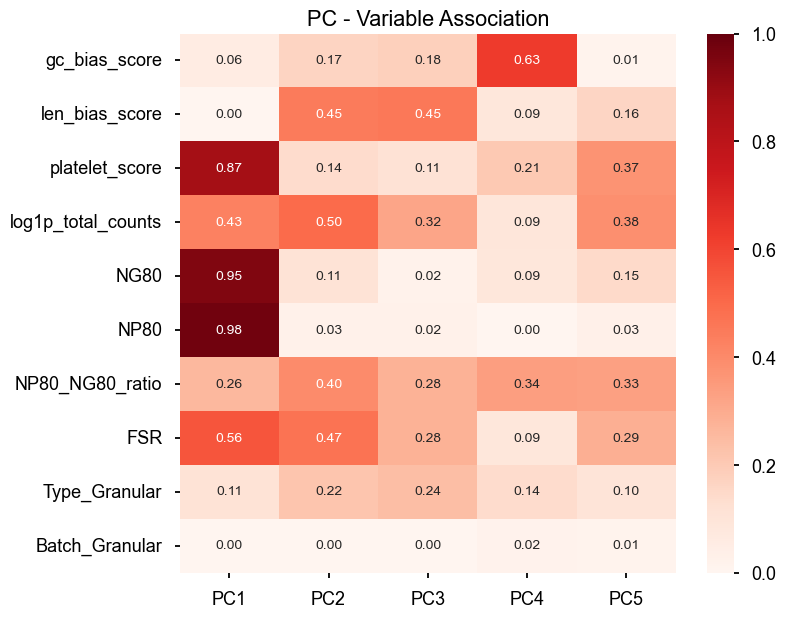

--- [Analysis] Partial Correlation (Control Confounders) ---


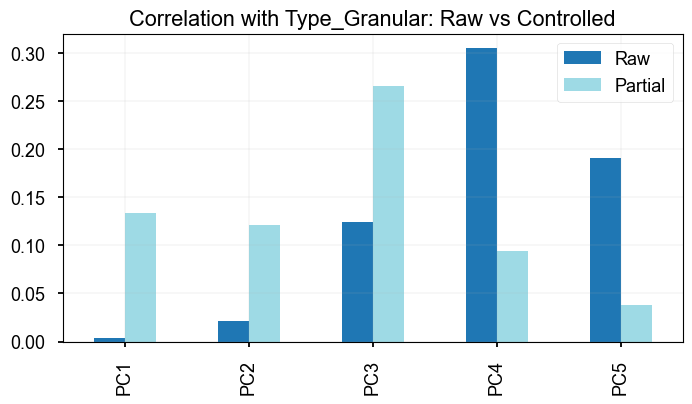

--- [Analysis] Cascade Correction (Method: combat) ---
   -> Regress out ['gc_bias_score', 'len_bias_score', 'log1p_total_counts', 'NG80', 'NP80', 'NP80_NG80_ratio', 'FSR']
   -> Regress out ['platelet_score']
   -> ComBat on ['Batch_Granular']


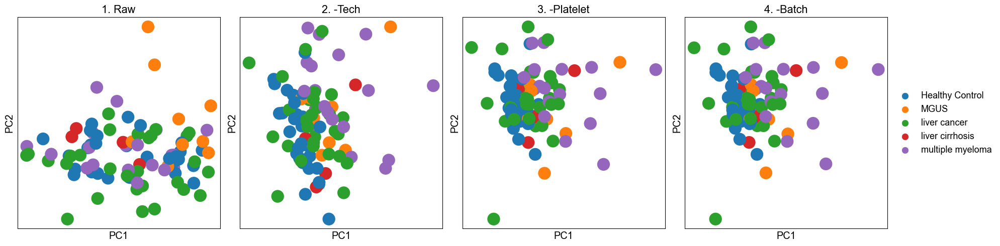

Displaying Metric Evolution...


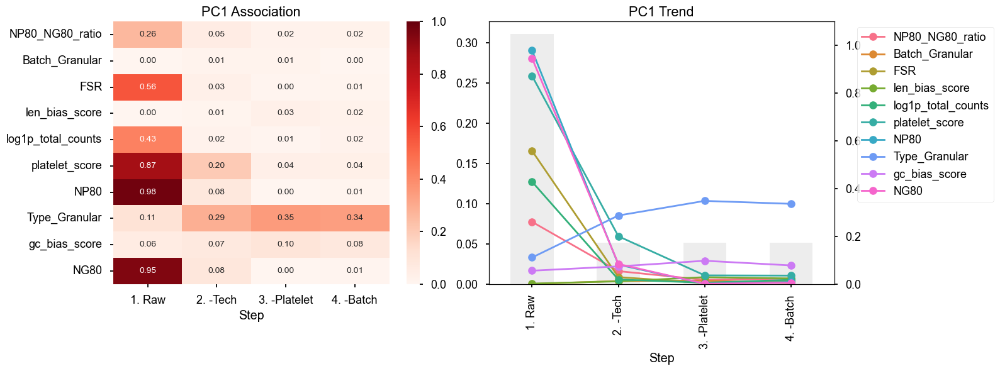

--- Finished Analysis for PRJNA758012 ---

 Processing: PRJNA1073463-1073465
--- [Init] Preparing Metadata ---
  Active Metrics for Analysis: ['gc_bias_score', 'len_bias_score', 'platelet_score', 'log1p_total_counts', 'NG80', 'NP80', 'NP80_NG80_ratio', 'FSR']
--- Set Layer: Switching to 'Standard_LogCPM' ---
   [Filtering] Dropped 34646 genes with 0 expression in this layer.
   Remaining genes: 18680
   PCA reset. Active layer ready.

--- [Analysis] PCA Diagnostics ---


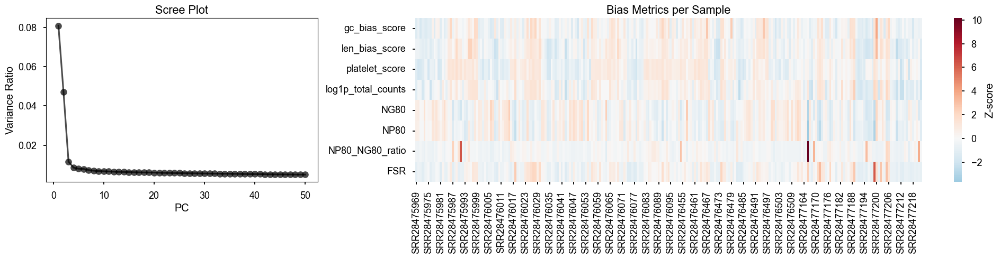


[Info] Simplified batch labels for plotting (Original -> Simple):
  * batch_1 : MS_PRJNA1073463-1073465_NextSeq 500_Plasma_cDNA_Kisenyi
  * batch_2 : MS_PRJNA1073463-1073465_NextSeq 500_Plasma_cDNA_Mulago
  * batch_3 : MS_PRJNA1073463-1073465_NextSeq 500_Plasma_cDNA_Philippines
  * batch_4 : MS_PRJNA1073463-1073465_NextSeq 500_Plasma_cDNA_Uganda
  * batch_5 : MS_PRJNA1073463-1073465_NextSeq 500_Plasma_cDNA_Vietnam

--- [Analysis] PCA Scatter Plots ---


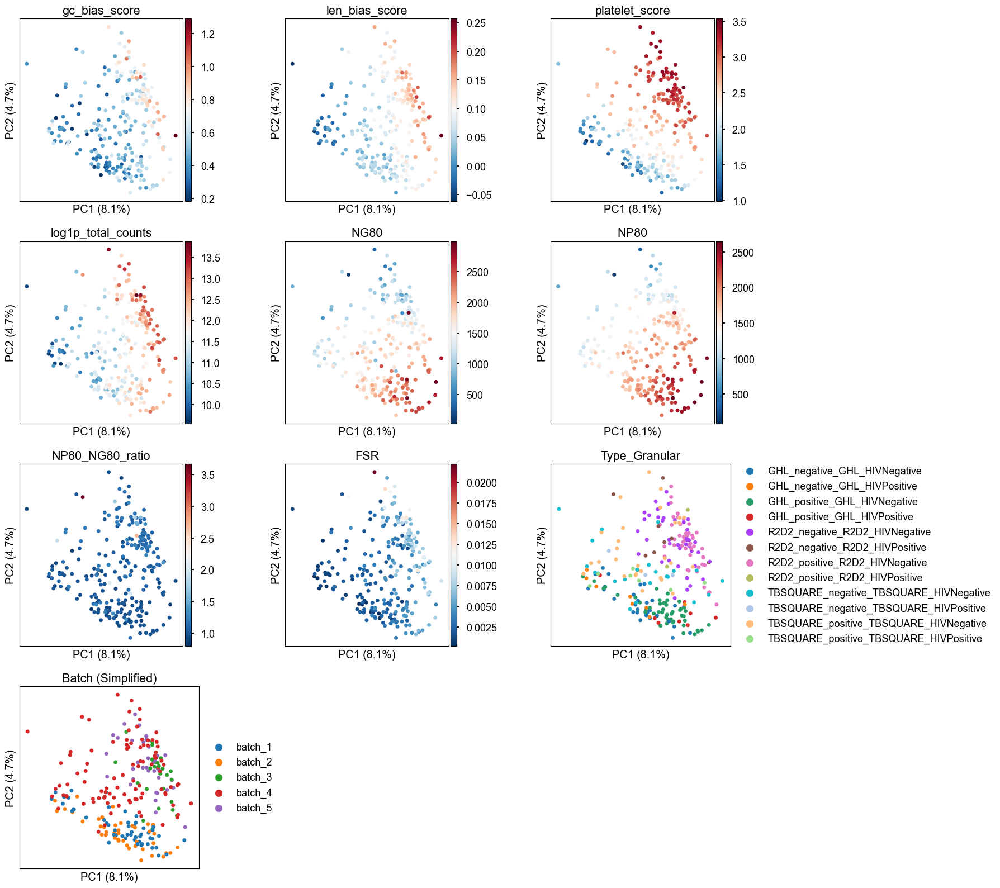

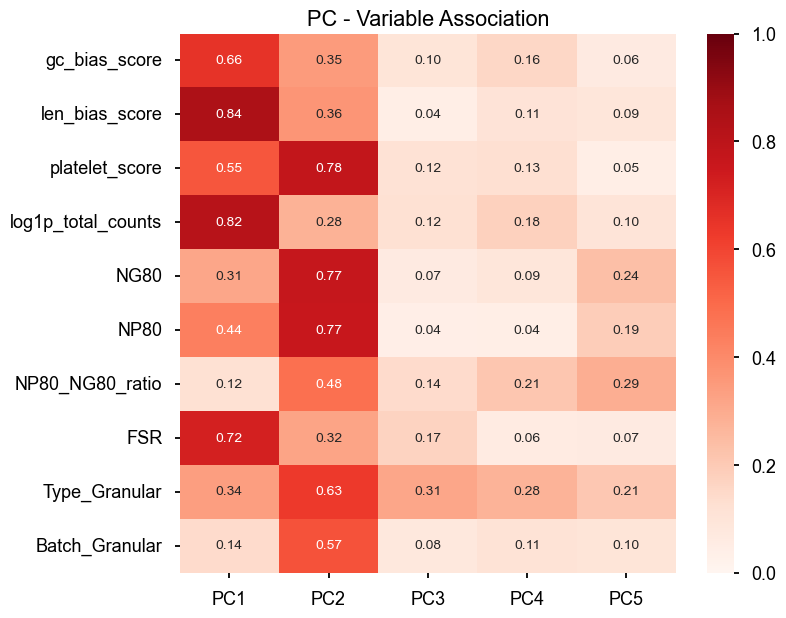

--- [Analysis] Partial Correlation (Control Confounders) ---


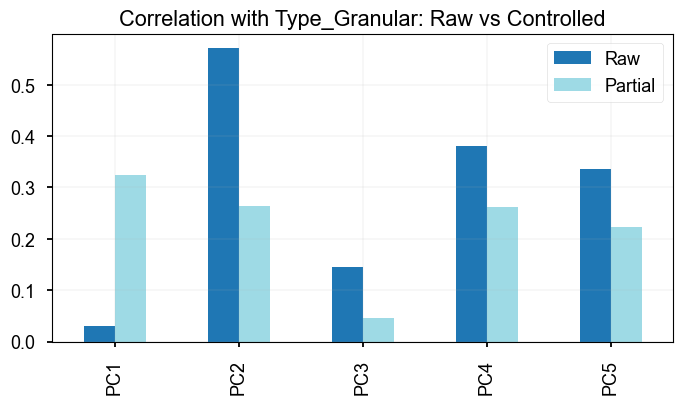

--- [Analysis] Cascade Correction (Method: combat) ---
   -> Regress out ['gc_bias_score', 'len_bias_score', 'log1p_total_counts', 'NG80', 'NP80', 'NP80_NG80_ratio', 'FSR']
   -> Regress out ['platelet_score']
   -> ComBat on ['Batch_Granular']


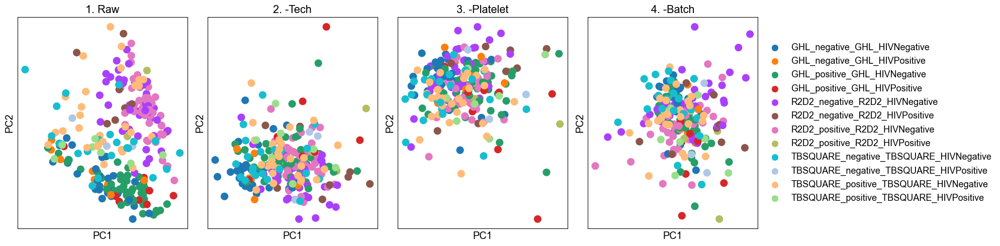

Displaying Metric Evolution...


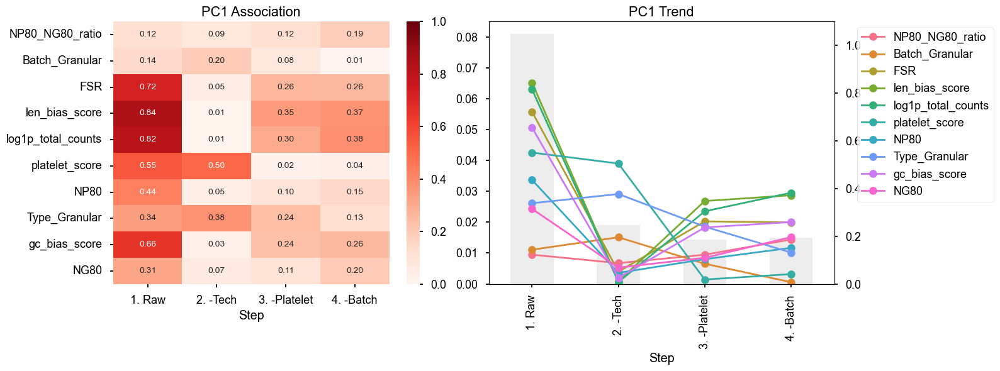

--- Finished Analysis for PRJNA1073463-1073465 ---

 Processing: PRJNA517339
--- [Init] Preparing Metadata ---
  Active Metrics for Analysis: ['gc_bias_score', 'len_bias_score', 'platelet_score', 'log1p_total_counts', 'NG80', 'NP80', 'NP80_NG80_ratio', 'FSR']
--- Set Layer: Switching to 'Standard_LogCPM' ---
   [Filtering] Dropped 22207 genes with 0 expression in this layer.
   Remaining genes: 19377
   PCA reset. Active layer ready.

--- [Analysis] PCA Diagnostics ---


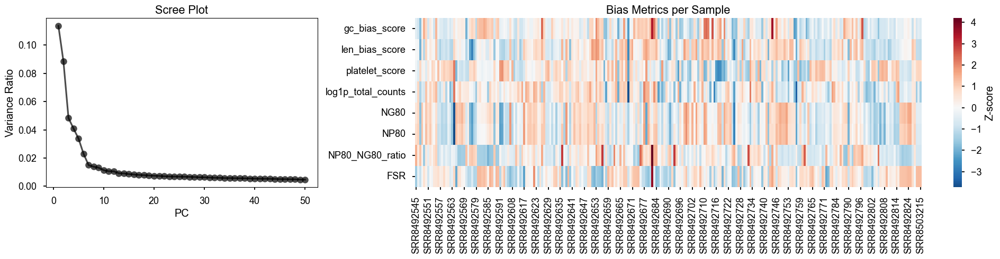


[Info] Simplified batch labels for plotting (Original -> Simple):
  * batch_1 : MS_PRJNA517339_NextSeq 500_Plasma_unspecified
  * batch_2 : MS_PRJNA517339_NextSeq 500_Serum_unspecified

--- [Analysis] PCA Scatter Plots ---


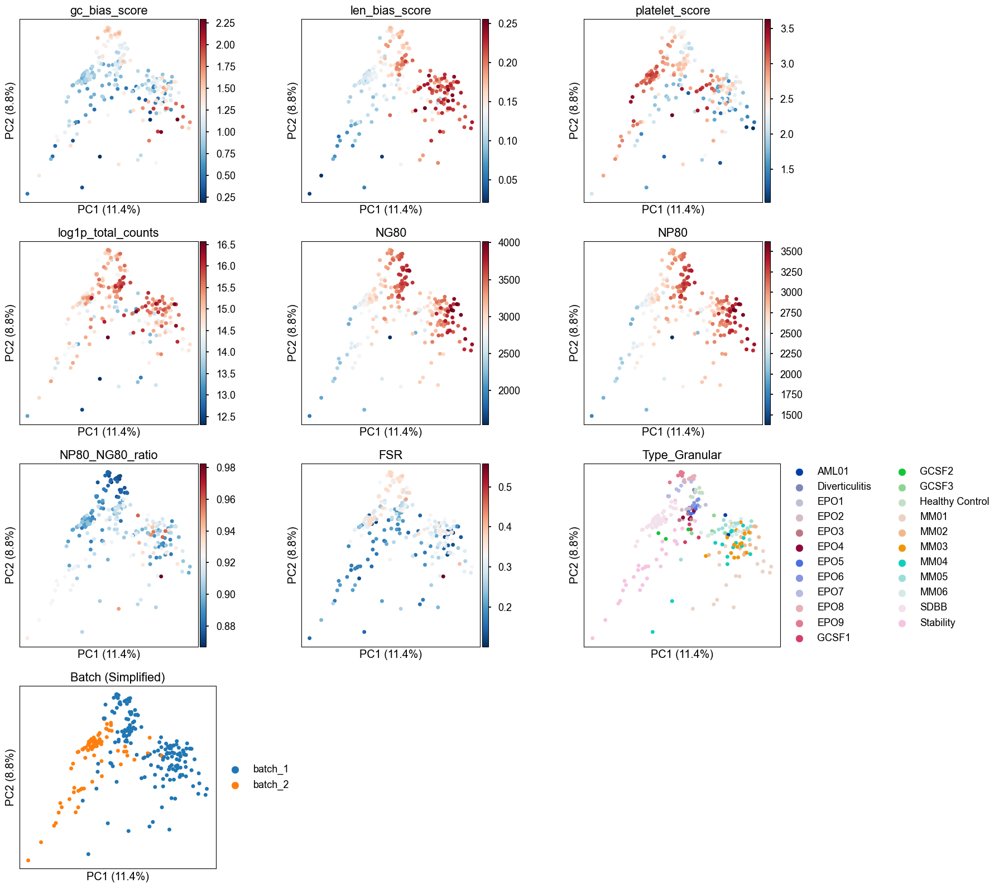

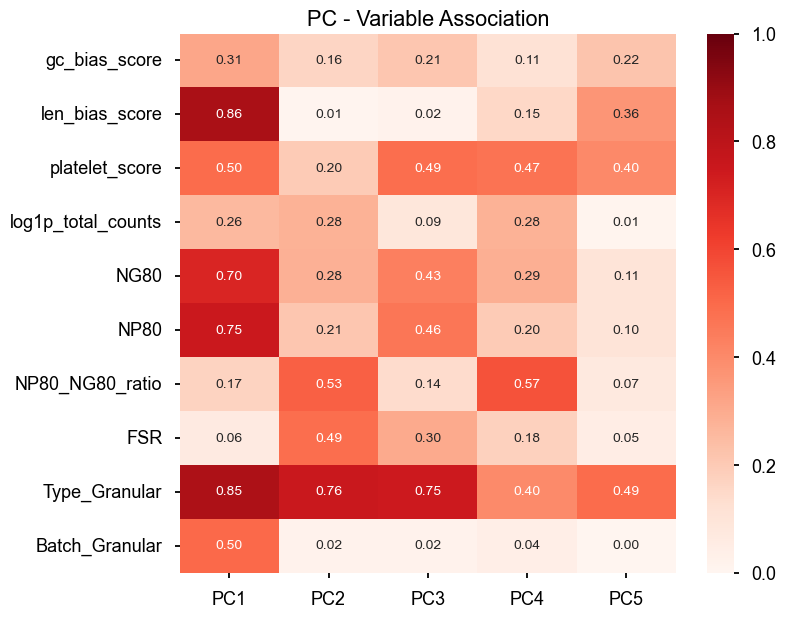

--- [Analysis] Partial Correlation (Control Confounders) ---


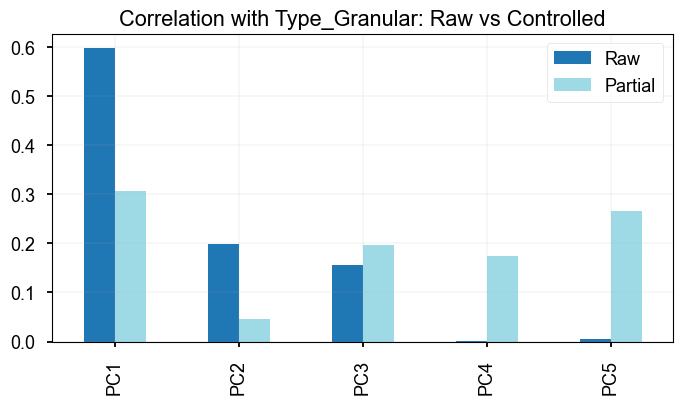

--- [Analysis] Cascade Correction (Method: combat) ---
   -> Regress out ['gc_bias_score', 'len_bias_score', 'log1p_total_counts', 'NG80', 'NP80', 'NP80_NG80_ratio', 'FSR']
   -> Regress out ['platelet_score']
   -> ComBat on ['Batch_Granular']


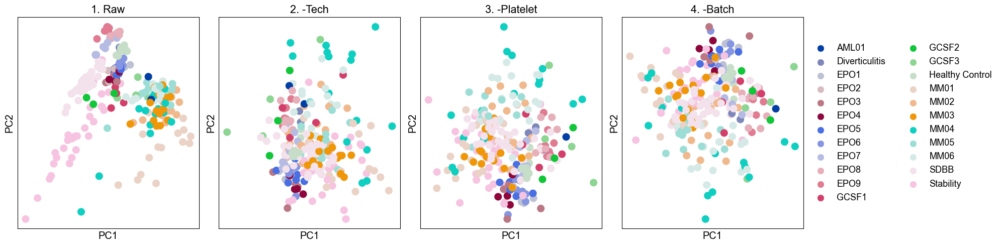

Displaying Metric Evolution...


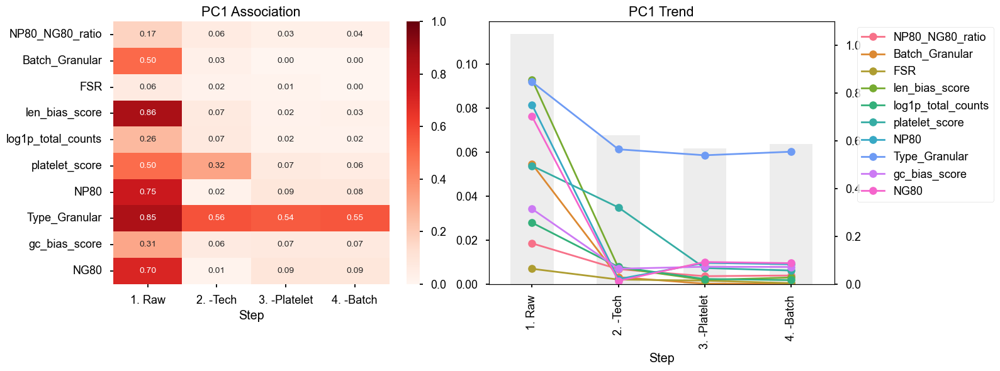

--- Finished Analysis for PRJNA517339 ---


In [9]:
seq_ids = adata.obs['BioProject'].unique()
bias_metrics = ['gc_bias_score', 'len_bias_score', 'platelet_score', 'log1p_total_counts', 'NG80', 'NP80', 'NP80_NG80_ratio','FSR']
for sid in seq_ids:
    try : 
        print(f"\n{'='*30}\n Processing: {sid}\n{'='*30}")
        
        adata_sub = adata[adata.obs.BioProject == sid].copy()
        sc.pp.filter_genes(adata_sub, min_cells=1)
        
        pipeline = RNASeqQCPipeline(
            adata=adata_sub,              
            analysis_metrics=bias_metrics,
            phenotype_col='Type_Granular',
            batch_col='Batch_Granular')
        
        pipeline.set_layer('Standard_LogCPM')
        pipeline.run_pca_diagnostics()
        pipeline.analyze_pc_associations()
        pipeline.analyze_partial_correlation()
        pipeline.run_cascade_analysis()

        print(f"--- Finished Analysis for {sid} ---")
    except : 
        print(f"Error in {sid}")

## Replicates

In [12]:
obs = pipeline.adata.obs.copy()
obs['Replicate_Group']

SRR8492545     3549.0
SRR8492546     6949.0
SRR8492547    11759.0
SRR8492548     3408.0
SRR8492549    14552.0
               ...   
SRR8492826    12627.0
SRR8492827     3541.0
SRR8502431    13126.0
SRR8502432    13126.0
SRR8503215    13126.0
Name: Replicate_Group, Length: 253, dtype: float64